# Business Objective


The loan providing companies find it hard to give loans to the people due to their insufficient or non-existent credit history. Because of that, some consumers use it as their advantage by becoming a defaulter. Suppose you work for a consumer finance company which specialises in lending various types of loans to urban customers. You have to use EDA to analyse the patterns present in the data. This will ensure that the applicants capable of repaying the loan are not rejected.

In [1]:
import numpy as np,pandas as pd
import seaborn as sns,matplotlib.pyplot as plt 
import warnings as w
w.filterwarnings('ignore')

In [2]:
# Read the csv file using 'read_csv'.
ap = pd.read_csv("application_data.csv")
pre = pd.read_csv("previous_application.csv")

In [3]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [4]:
ap.head(1)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.0,0.069,0.0833,0.125,0.0369,0.0202,0.019,0.0,0.0,0.0252,0.0383,0.9722,0.6341,0.0144,0.0,0.069,0.0833,0.125,0.0377,0.022,0.0198,0.0,0.0,0.025,0.0369,0.9722,0.6243,0.0144,0.0,0.069,0.0833,0.125,0.0375,0.0205,0.0193,0.0,0.0,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0


In [5]:
pre.head(1)

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.43,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0


- ### XNA - Not available
- ### XAP - Not applicable

This becomes more clear is we analyze code_reject_reason in previous_application data. Values are XAP for those applications which are not rejected indicating not applicable.

In [6]:
# Checking the summary for the numeric columns
ap.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,104582.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307509.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,134133.000000,3.068510e+05,246546.000000,151450.00000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,159080.000000,306490.000000,306490.000000,306490.000000,306490.000000,307510.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.00000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,-4986.120328,-2994.202373,12.061091,0.999997,0.819889,0.199368,0.998133,0.281066,0.056720,2.152665,2.052463,2.031521,12.063419,0.015144,0.050769,0.040659,0.078173,0.230454,0.179555,0.502130,5.143927e-01,0.510853,0.11744,0.088442,0.977735,0.752471,0.044621,0.078942,0.149725,0.226282,0.231894,0.066333,0.100775,0.107399,0.008809,0.028358,0.114231,0.087543,0.977065,0.759637,0.042553,0.074490,0.145193,0.222315,0.228058,0.064958,0.105645,0.105975,0.008076,0.027022,0.117850,0.087955,0.97

In [7]:
# Check the column-wise info of the dataframe
ap.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


In [8]:
# Check the number of rows and columns in the dataframe
ap.shape

(307511, 122)

In [9]:
# Check the number of rows and columns in the dataframe
pre.shape

(1670214, 37)

**Data Cleaning**

In [10]:
#Inspecting the dataframe for null values
ap.isnull().sum()

SK_ID_CURR                           0
TARGET                               0
NAME_CONTRACT_TYPE                   0
CODE_GENDER                          0
FLAG_OWN_CAR                         0
FLAG_OWN_REALTY                      0
CNT_CHILDREN                         0
AMT_INCOME_TOTAL                     0
AMT_CREDIT                           0
AMT_ANNUITY                         12
AMT_GOODS_PRICE                    278
NAME_TYPE_SUITE                   1292
NAME_INCOME_TYPE                     0
NAME_EDUCATION_TYPE                  0
NAME_FAMILY_STATUS                   0
NAME_HOUSING_TYPE                    0
REGION_POPULATION_RELATIVE           0
DAYS_BIRTH                           0
DAYS_EMPLOYED                        0
DAYS_REGISTRATION                    0
DAYS_ID_PUBLISH                      0
OWN_CAR_AGE                     202929
FLAG_MOBIL                           0
FLAG_EMP_PHONE                       0
FLAG_WORK_PHONE                      0
FLAG_CONT_MOBILE         

In [11]:
#Inspecting the dataframe for null values
pre.isnull().sum()

SK_ID_PREV                           0
SK_ID_CURR                           0
NAME_CONTRACT_TYPE                   0
AMT_ANNUITY                     372235
AMT_APPLICATION                      0
AMT_CREDIT                           1
AMT_DOWN_PAYMENT                895844
AMT_GOODS_PRICE                 385515
WEEKDAY_APPR_PROCESS_START           0
HOUR_APPR_PROCESS_START              0
FLAG_LAST_APPL_PER_CONTRACT          0
NFLAG_LAST_APPL_IN_DAY               0
RATE_DOWN_PAYMENT               895844
RATE_INTEREST_PRIMARY          1664263
RATE_INTEREST_PRIVILEGED       1664263
NAME_CASH_LOAN_PURPOSE               0
NAME_CONTRACT_STATUS                 0
DAYS_DECISION                        0
NAME_PAYMENT_TYPE                    0
CODE_REJECT_REASON                   0
NAME_TYPE_SUITE                 820405
NAME_CLIENT_TYPE                     0
NAME_GOODS_CATEGORY                  0
NAME_PORTFOLIO                       0
NAME_PRODUCT_TYPE                    0
CHANNEL_TYPE             

In [12]:
# Check the column-wise info of the dataframe pre
pre.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

In [13]:
# Check the column-wise info of the dataframe ap
ap.info(verbose = True, null_counts = True) 
# verbose : bool, optional Whether to print the full summary.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 122 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   SK_ID_CURR                    307511 non-null  int64  
 1   TARGET                        307511 non-null  int64  
 2   NAME_CONTRACT_TYPE            307511 non-null  object 
 3   CODE_GENDER                   307511 non-null  object 
 4   FLAG_OWN_CAR                  307511 non-null  object 
 5   FLAG_OWN_REALTY               307511 non-null  object 
 6   CNT_CHILDREN                  307511 non-null  int64  
 7   AMT_INCOME_TOTAL              307511 non-null  float64
 8   AMT_CREDIT                    307511 non-null  float64
 9   AMT_ANNUITY                   307499 non-null  float64
 10  AMT_GOODS_PRICE               307233 non-null  float64
 11  NAME_TYPE_SUITE               306219 non-null  object 
 12  NAME_INCOME_TYPE              307511 non-nu

In [14]:
#Check the datatypes of the columns
ap.dtypes

SK_ID_CURR                        int64
TARGET                            int64
NAME_CONTRACT_TYPE               object
CODE_GENDER                      object
FLAG_OWN_CAR                     object
FLAG_OWN_REALTY                  object
CNT_CHILDREN                      int64
AMT_INCOME_TOTAL                float64
AMT_CREDIT                      float64
AMT_ANNUITY                     float64
AMT_GOODS_PRICE                 float64
NAME_TYPE_SUITE                  object
NAME_INCOME_TYPE                 object
NAME_EDUCATION_TYPE              object
NAME_FAMILY_STATUS               object
NAME_HOUSING_TYPE                object
REGION_POPULATION_RELATIVE      float64
DAYS_BIRTH                        int64
DAYS_EMPLOYED                     int64
DAYS_REGISTRATION               float64
DAYS_ID_PUBLISH                   int64
OWN_CAR_AGE                     float64
FLAG_MOBIL                        int64
FLAG_EMP_PHONE                    int64
FLAG_WORK_PHONE                   int64


In [15]:
# Finding the null value based on percentage

round((ap.isnull().sum()/len(ap.index))*100,2).sort_values(ascending = False)

COMMONAREA_MEDI                 69.87
COMMONAREA_AVG                  69.87
COMMONAREA_MODE                 69.87
NONLIVINGAPARTMENTS_MODE        69.43
NONLIVINGAPARTMENTS_MEDI        69.43
NONLIVINGAPARTMENTS_AVG         69.43
FONDKAPREMONT_MODE              68.39
LIVINGAPARTMENTS_MEDI           68.35
LIVINGAPARTMENTS_MODE           68.35
LIVINGAPARTMENTS_AVG            68.35
FLOORSMIN_MEDI                  67.85
FLOORSMIN_MODE                  67.85
FLOORSMIN_AVG                   67.85
YEARS_BUILD_MEDI                66.50
YEARS_BUILD_AVG                 66.50
YEARS_BUILD_MODE                66.50
OWN_CAR_AGE                     65.99
LANDAREA_MODE                   59.38
LANDAREA_AVG                    59.38
LANDAREA_MEDI                   59.38
BASEMENTAREA_MEDI               58.52
BASEMENTAREA_AVG                58.52
BASEMENTAREA_MODE               58.52
EXT_SOURCE_1                    56.38
NONLIVINGAREA_MEDI              55.18
NONLIVINGAREA_AVG               55.18
NONLIVINGARE

- ALTERNATIVE WAY OF CALCULATING PERCENTAGE USING SHAPE

- round((ap.isnull().sum()/ap.shape[0])*100,2).sort_values(ascending = False).head(55)



**Market standard says most of the times we can drop columns with more than 25-30% missing data, according to the use case**

**Occupation Type lies in the border line with 31% null values. But, we believe Occupation Type plays a significant role in  finding whether the person will default or not. Hence we are deciding to drop columns with more than 40% of missing values (Since there is no column with null value percentages between 31-40%)**

In [16]:
# Shape of data before removing the null values
ap.shape

(307511, 122)

In [17]:
# Removing the null values whose percentage is greater than 40 and storing in a new dataframe
app = ap.drop(ap.loc[:,ap.isnull().mean()>0.4].columns,axis = 1)

In [18]:
app.head(1)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0


In [19]:
# Shape of data After removing the null values > 40%
app.shape

(307511, 73)

In [20]:
#Since there are no nullvalues between 33% and 40% and 
#we needed OCCUPATION_TYPE for analysis hence writing the below code to get OCCUPATION_TYPE
pd.Series(app.columns[(app.isnull().mean()<0.33) & (app.isnull().mean()>0.0)])

0                    AMT_ANNUITY
1                AMT_GOODS_PRICE
2                NAME_TYPE_SUITE
3                OCCUPATION_TYPE
4                CNT_FAM_MEMBERS
5                   EXT_SOURCE_2
6                   EXT_SOURCE_3
7       OBS_30_CNT_SOCIAL_CIRCLE
8       DEF_30_CNT_SOCIAL_CIRCLE
9       OBS_60_CNT_SOCIAL_CIRCLE
10      DEF_60_CNT_SOCIAL_CIRCLE
11        DAYS_LAST_PHONE_CHANGE
12    AMT_REQ_CREDIT_BUREAU_HOUR
13     AMT_REQ_CREDIT_BUREAU_DAY
14    AMT_REQ_CREDIT_BUREAU_WEEK
15     AMT_REQ_CREDIT_BUREAU_MON
16     AMT_REQ_CREDIT_BUREAU_QRT
17    AMT_REQ_CREDIT_BUREAU_YEAR
dtype: object

These are the columns needed for analysis based on business understanding:
-  AMT_ANNUITY
-  AMT_GOODS_PRICE
-  NAME_TYPE_SUITE
-  CNT_FAM_MEMBERS
- OCCUPATION_TYPE

In [21]:
#Creating a dataframe where sum of null values >600 and converting the dataframe into list
app_nulls = list(app.isnull().sum()[app.isnull().sum()>600].index)

In [22]:
app.isnull().sum()

SK_ID_CURR                         0
TARGET                             0
NAME_CONTRACT_TYPE                 0
CODE_GENDER                        0
FLAG_OWN_CAR                       0
FLAG_OWN_REALTY                    0
CNT_CHILDREN                       0
AMT_INCOME_TOTAL                   0
AMT_CREDIT                         0
AMT_ANNUITY                       12
AMT_GOODS_PRICE                  278
NAME_TYPE_SUITE                 1292
NAME_INCOME_TYPE                   0
NAME_EDUCATION_TYPE                0
NAME_FAMILY_STATUS                 0
NAME_HOUSING_TYPE                  0
REGION_POPULATION_RELATIVE         0
DAYS_BIRTH                         0
DAYS_EMPLOYED                      0
DAYS_REGISTRATION                  0
DAYS_ID_PUBLISH                    0
FLAG_MOBIL                         0
FLAG_EMP_PHONE                     0
FLAG_WORK_PHONE                    0
FLAG_CONT_MOBILE                   0
FLAG_PHONE                         0
FLAG_EMAIL                         0
O

In [23]:
app.isnull().sum()[app.isnull().sum()>600]

NAME_TYPE_SUITE                1292
OCCUPATION_TYPE               96391
EXT_SOURCE_2                    660
EXT_SOURCE_3                  60965
OBS_30_CNT_SOCIAL_CIRCLE       1021
DEF_30_CNT_SOCIAL_CIRCLE       1021
OBS_60_CNT_SOCIAL_CIRCLE       1021
DEF_60_CNT_SOCIAL_CIRCLE       1021
AMT_REQ_CREDIT_BUREAU_HOUR    41519
AMT_REQ_CREDIT_BUREAU_DAY     41519
AMT_REQ_CREDIT_BUREAU_WEEK    41519
AMT_REQ_CREDIT_BUREAU_MON     41519
AMT_REQ_CREDIT_BUREAU_QRT     41519
AMT_REQ_CREDIT_BUREAU_YEAR    41519
dtype: int64

In [24]:
app_nulls

['NAME_TYPE_SUITE',
 'OCCUPATION_TYPE',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'AMT_REQ_CREDIT_BUREAU_HOUR',
 'AMT_REQ_CREDIT_BUREAU_DAY',
 'AMT_REQ_CREDIT_BUREAU_WEEK',
 'AMT_REQ_CREDIT_BUREAU_MON',
 'AMT_REQ_CREDIT_BUREAU_QRT',
 'AMT_REQ_CREDIT_BUREAU_YEAR']

Actual columns needed for analysis :
-  AMT_ANNUITY
-  AMT_GOODS_PRICE
-  NAME_TYPE_SUITE
-  CNT_FAM_MEMBERS
- OCCUPATION_TYPE

In [25]:
print(type(app_nulls))

<class 'list'>


In [26]:
#Removing 'NAME_TYPE_SUITE','OCCUPATION_TYPE' and adding 'DAYS_LAST_PHONE_CHANGE' to the list app_nulls
app_nulls.remove('NAME_TYPE_SUITE')
app_nulls.remove('OCCUPATION_TYPE')
app_nulls.append('DAYS_LAST_PHONE_CHANGE')

In [27]:
#checking for the updated list app_nulls
app_nulls

['EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'AMT_REQ_CREDIT_BUREAU_HOUR',
 'AMT_REQ_CREDIT_BUREAU_DAY',
 'AMT_REQ_CREDIT_BUREAU_WEEK',
 'AMT_REQ_CREDIT_BUREAU_MON',
 'AMT_REQ_CREDIT_BUREAU_QRT',
 'AMT_REQ_CREDIT_BUREAU_YEAR',
 'DAYS_LAST_PHONE_CHANGE']

In [28]:
#Dropping app_nulls from dataframe app
app.drop(app_nulls,axis=1,inplace=True)

In [29]:
#rechecking for null values in dataframe app
app.isnull().sum()[app.isnull().sum()>0]

AMT_ANNUITY           12
AMT_GOODS_PRICE      278
NAME_TYPE_SUITE     1292
OCCUPATION_TYPE    96391
CNT_FAM_MEMBERS        2
dtype: int64

In [30]:
#Fetching all flags columns as they wont be needed for analysis
flags = app.filter(regex='^FLAG',axis=1).columns.tolist()

In [31]:
flags

['FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'FLAG_DOCUMENT_2',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_4',
 'FLAG_DOCUMENT_5',
 'FLAG_DOCUMENT_6',
 'FLAG_DOCUMENT_7',
 'FLAG_DOCUMENT_8',
 'FLAG_DOCUMENT_9',
 'FLAG_DOCUMENT_10',
 'FLAG_DOCUMENT_11',
 'FLAG_DOCUMENT_12',
 'FLAG_DOCUMENT_13',
 'FLAG_DOCUMENT_14',
 'FLAG_DOCUMENT_15',
 'FLAG_DOCUMENT_16',
 'FLAG_DOCUMENT_17',
 'FLAG_DOCUMENT_18',
 'FLAG_DOCUMENT_19',
 'FLAG_DOCUMENT_20',
 'FLAG_DOCUMENT_21']

In [32]:
#'Removing 'FLAG_OWN_CAR' & 'FLAG_OWN_REALTY' as they would be needed for analysis in this case study'
flags.remove('FLAG_OWN_CAR')
flags.remove('FLAG_OWN_REALTY')

In [33]:
#Dropping the flags column as it wont be needed for analysis
app.drop(flags,axis = 1 ,inplace=True)

In [34]:
app.shape

(307511, 34)

**Handling Null Values** 

In [35]:
app.isnull().sum()[app.isnull().sum()>0]

AMT_ANNUITY           12
AMT_GOODS_PRICE      278
NAME_TYPE_SUITE     1292
OCCUPATION_TYPE    96391
CNT_FAM_MEMBERS        2
dtype: int64

In [36]:
app.AMT_ANNUITY.value_counts(normalize=True)

9000.0      0.020764
13500.0     0.017932
6750.0      0.007411
10125.0     0.006618
37800.0     0.005210
11250.0     0.004745
26217.0     0.004725
20250.0     0.004374
12375.0     0.004354
31653.0     0.004127
26640.0     0.004020
22500.0     0.004013
16875.0     0.003945
36459.0     0.003873
33025.5     0.003050
26446.5     0.002979
22018.5     0.002940
23773.5     0.002846
25537.5     0.002719
26316.0     0.002696
31261.5     0.002673
21906.0     0.002602
7875.0      0.002410
40320.0     0.002286
21888.0     0.002237
32602.5     0.002234
15750.0     0.002224
27000.0     0.002215
19867.5     0.002124
33750.0     0.002120
29970.0     0.002091
21775.5     0.002091
30528.0     0.002036
45000.0     0.001854
32895.0     0.001834
14350.5     0.001834
14751.0     0.001792
23494.5     0.001756
42790.5     0.001714
26086.5     0.001649
29250.0     0.001646
23931.0     0.001629
31630.5     0.001623
31522.5     0.001610
24939.0     0.001597
16456.5     0.001594
19125.0     0.001532
21109.5     0

**SINCE THE BELOW GRAPH HAS OUTLIERS IMPUTE WITH MEDIAN IS THE BEST OPTION**

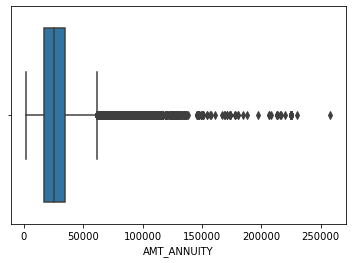

In [37]:
#Plotting a box plot for AMT_ANNUITY to check for outliers
sns.boxplot(app.AMT_ANNUITY)
plt.show()

# SINCE THE BELOW GRAPH HAS OUTLIERS IMPUTE WITH MEDIAN IS THE BEST OPTION.

In [38]:
#Finding the MEDIAN value
app.AMT_ANNUITY.median()

24903.0

In [39]:
# IMPUTING AMT_ANNUITY with median
app.AMT_ANNUITY = app.AMT_ANNUITY.fillna(app.AMT_ANNUITY.median())

In [40]:
pd.Series(app.columns[(app.isnull().mean()<0.13) & (app.isnull().mean()>0.0)])

0    AMT_GOODS_PRICE
1    NAME_TYPE_SUITE
2    CNT_FAM_MEMBERS
dtype: object

**NAME_TYPE_SUITE**

In [41]:
# SINCE THE BELOW IS THE OBJECT DATA TYPE, WHICH IS CATEGORICAL TYPE.
# IMPUTE WITH MODE
app.NAME_TYPE_SUITE.describe()

count            306219
unique                7
top       Unaccompanied
freq             248526
Name: NAME_TYPE_SUITE, dtype: object

In [42]:
# FIRST  FIND OUT THE MODE VALUE
app.NAME_TYPE_SUITE.value_counts(normalize=True)
# BELOW TELLS US THAT Unaccompanied has 80 percent of data for tht column

Unaccompanied      0.811596
Family             0.131112
Spouse, partner    0.037130
Children           0.010669
Other_B            0.005780
Other_A            0.002828
Group of people    0.000885
Name: NAME_TYPE_SUITE, dtype: float64

In [43]:
app.NAME_TYPE_SUITE.mode()[0]

'Unaccompanied'

**SINCE THE BELOW IS THE OBJECT DATA TYPE, WHICH IS CATEGORICAL TYPE.IMPUTE WITH MODE**

In [44]:
# IMPUTING Name_Type_Suite
app.NAME_TYPE_SUITE = app.NAME_TYPE_SUITE.fillna(app.NAME_TYPE_SUITE.mode()[0])

**CNT_FAM_MEMBERS**

In [45]:
app.CNT_FAM_MEMBERS.value_counts()

2.0     158357
1.0      67847
3.0      52601
4.0      24697
5.0       3478
6.0        408
7.0         81
8.0         20
9.0          6
10.0         3
14.0         2
16.0         2
12.0         2
20.0         2
11.0         1
13.0         1
15.0         1
Name: CNT_FAM_MEMBERS, dtype: int64

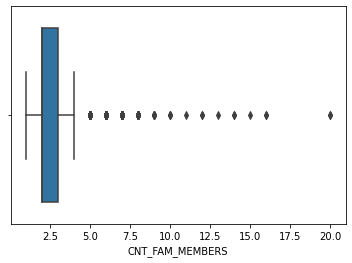

In [46]:
#Plotting a box plot for CNT_FAM_MEMBERS to check for outliers 
sns.boxplot(app.CNT_FAM_MEMBERS)
plt.show()

In [47]:
#Finding the MEDIAN value
app.CNT_FAM_MEMBERS.median()

2.0

In [48]:
#IMPUTING CNT_FAM_MEMBERS with median
app.CNT_FAM_MEMBERS = app.CNT_FAM_MEMBERS.fillna(app.CNT_FAM_MEMBERS.median())

**AMT_GOODS_PRICE**

In [49]:
app.AMT_GOODS_PRICE.value_counts(normalize=True)

450000.0     0.084698
225000.0     0.082289
675000.0     0.081248
900000.0     0.050177
270000.0     0.037197
180000.0     0.032949
454500.0     0.029805
1125000.0    0.029456
135000.0     0.026709
315000.0     0.017007
1350000.0    0.016395
679500.0     0.015701
238500.0     0.015285
360000.0     0.014819
247500.0     0.014054
463500.0     0.012606
540000.0     0.012248
495000.0     0.011272
202500.0     0.010487
90000.0      0.010315
405000.0     0.009615
472500.0     0.009205
157500.0     0.008801
585000.0     0.008616
337500.0     0.008140
229500.0     0.007935
112500.0     0.007063
630000.0     0.007044
1800000.0    0.006985
720000.0     0.006256
1575000.0    0.006103
688500.0     0.005937
292500.0     0.005559
148500.0     0.005449
477000.0     0.005244
810000.0     0.005104
67500.0      0.004899
697500.0     0.004583
382500.0     0.004544
765000.0     0.004544
904500.0     0.004475
283500.0     0.004466
252000.0     0.004453
234000.0     0.004163
45000.0      0.003805
945000.0  

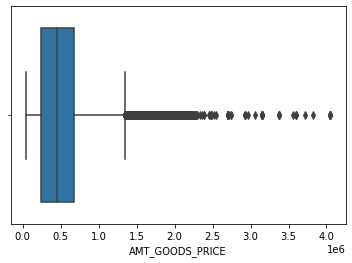

In [50]:
#Plotting a box plot for AMT_GOODS_PRICE to check for outliers
sns.boxplot(app.AMT_GOODS_PRICE)
plt.show()

In [51]:
#Finding the MEDIAN value
app.AMT_GOODS_PRICE.median()

450000.0

In [52]:
#IMPUTING AMT_GOODS_PRICE with median
app.AMT_GOODS_PRICE = app.AMT_GOODS_PRICE.fillna(app.AMT_GOODS_PRICE.median())

**OCCUPATION_TYPE**

In [53]:
#checking for OCCUPATION_TYPE as this column is important for our analysis
pd.Series(app.columns[(app.isnull().mean()<0.33) & (app.isnull().mean()>0.0)])

0    OCCUPATION_TYPE
dtype: object

In [54]:
app.OCCUPATION_TYPE.value_counts(normalize=True)

Laborers                 0.261396
Sales staff              0.152056
Core staff               0.130589
Managers                 0.101227
Drivers                  0.088116
High skill tech staff    0.053903
Accountants              0.046481
Medicine staff           0.040437
Security staff           0.031835
Cooking staff            0.028164
Cleaning staff           0.022040
Private service staff    0.012562
Low-skill Laborers       0.009914
Waiters/barmen staff     0.006385
Secretaries              0.006181
Realty agents            0.003557
HR staff                 0.002667
IT staff                 0.002491
Name: OCCUPATION_TYPE, dtype: float64

In [55]:
#Null values for OCCUPATION_TYPE to be replaced by 'Not Specified' as this cannot be replaced with mode value as it will create biased analysis
app.OCCUPATION_TYPE.fillna('Not Specified',inplace=True)

In [56]:
#checking for null values to see if there are anymore columns with null values
app.isnull().sum()

SK_ID_CURR                     0
TARGET                         0
NAME_CONTRACT_TYPE             0
CODE_GENDER                    0
FLAG_OWN_CAR                   0
FLAG_OWN_REALTY                0
CNT_CHILDREN                   0
AMT_INCOME_TOTAL               0
AMT_CREDIT                     0
AMT_ANNUITY                    0
AMT_GOODS_PRICE                0
NAME_TYPE_SUITE                0
NAME_INCOME_TYPE               0
NAME_EDUCATION_TYPE            0
NAME_FAMILY_STATUS             0
NAME_HOUSING_TYPE              0
REGION_POPULATION_RELATIVE     0
DAYS_BIRTH                     0
DAYS_EMPLOYED                  0
DAYS_REGISTRATION              0
DAYS_ID_PUBLISH                0
OCCUPATION_TYPE                0
CNT_FAM_MEMBERS                0
REGION_RATING_CLIENT           0
REGION_RATING_CLIENT_W_CITY    0
WEEKDAY_APPR_PROCESS_START     0
HOUR_APPR_PROCESS_START        0
REG_REGION_NOT_LIVE_REGION     0
REG_REGION_NOT_WORK_REGION     0
LIVE_REGION_NOT_WORK_REGION    0
REG_CITY_N

- Inference-We have cleaned the data and there are no more Null values present

**Correcting the datatypes**

In [57]:
app.dtypes 

SK_ID_CURR                       int64
TARGET                           int64
NAME_CONTRACT_TYPE              object
CODE_GENDER                     object
FLAG_OWN_CAR                    object
FLAG_OWN_REALTY                 object
CNT_CHILDREN                     int64
AMT_INCOME_TOTAL               float64
AMT_CREDIT                     float64
AMT_ANNUITY                    float64
AMT_GOODS_PRICE                float64
NAME_TYPE_SUITE                 object
NAME_INCOME_TYPE                object
NAME_EDUCATION_TYPE             object
NAME_FAMILY_STATUS              object
NAME_HOUSING_TYPE               object
REGION_POPULATION_RELATIVE     float64
DAYS_BIRTH                       int64
DAYS_EMPLOYED                    int64
DAYS_REGISTRATION              float64
DAYS_ID_PUBLISH                  int64
OCCUPATION_TYPE                 object
CNT_FAM_MEMBERS                float64
REGION_RATING_CLIENT             int64
REGION_RATING_CLIENT_W_CITY      int64
WEEKDAY_APPR_PROCESS_STAR

In [58]:
app.head(1)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3


In [59]:
#CNT_FAM_MEMBERS cannot be float. Converting this column to integer

app.CNT_FAM_MEMBERS=app.CNT_FAM_MEMBERS.apply(lambda x:int(x))

In [60]:
app.DAYS_BIRTH.value_counts()

-13749    43
-13481    42
-18248    41
-10020    41
-15771    40
-10292    40
-14395    39
-14267    39
-13263    39
-11664    39
-13584    38
-15565    38
-13788    38
-13480    38
-15042    38
-13634    38
-13891    38
-14791    38
-13217    37
-15450    37
-10136    37
-20074    37
-15048    37
-16690    37
-10107    37
-15563    37
-14790    37
-14767    37
-10192    37
-14890    37
-16257    37
-12806    37
-11108    37
-14276    37
-13706    36
-13904    36
-15322    36
-14926    36
-13708    36
-13643    36
-11524    36
-13271    36
-10519    36
-14137    36
-14776    36
-14386    36
-10213    35
-16490    35
-10123    35
-11588    35
-9981     35
-11266    35
-15044    35
-10088    35
-14120    35
-15073    35
-14825    35
-11097    35
-12776    35
-15155    35
-13254    35
-13273    35
-13922    35
-14099    35
-10223    35
-10978    35
-12682    35
-15164    35
-16185    35
-11135    35
-14131    35
-15009    35
-14384    35
-12433    35
-14350    35
-16830    35
-13687    35

In [61]:
# Days_employed,registrtion,id_publish cannot be in negative values. 

app.DAYS_EMPLOYED = app.DAYS_EMPLOYED.apply(lambda x: abs(x))
app.DAYS_REGISTRATION = app.DAYS_REGISTRATION.apply(lambda x: abs(x))
app.DAYS_ID_PUBLISH = app.DAYS_ID_PUBLISH.apply(lambda x: abs(x))

- We didnt change Days_Birth because all the values had negative value

In [62]:
-18248//-365.25

49.0

In [63]:
# Adding a column 'Age' and dividing by -365.25 to include leap years
app['Age'] = app['DAYS_BIRTH'] //-365.25

In [64]:
app.shape

(307511, 35)

In [65]:
app.head(1)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,Age
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,637,3648.0,2120,Laborers,1,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,25


In [66]:
# Dropping Days_Birth because we have calculated the age.
app.drop('DAYS_BIRTH',axis=1,inplace=True)

**Categorizing continuous variables into discrete intervals - Binning**

In [67]:
#BINNING AGE
app.Age.describe()

count    307511.000000
mean         43.405137
std          11.945779
min          20.000000
25%          33.000000
50%          43.000000
75%          53.000000
max          69.000000
Name: Age, dtype: float64

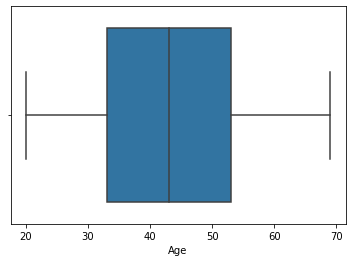

In [68]:
#plotting box plot for "Age"
sns.boxplot(app.Age)
plt.show()

In [69]:
#Creating bins because 20 is the minimum value value and maximum value is 69 hence we used 6 for binning these values
pd.cut(app.Age,bins = np.linspace(20, 70, 6))
pd.cut(app.Age,bins = np.linspace(20, 70, 6))

0         (20.0, 30.0]
1         (40.0, 50.0]
2         (50.0, 60.0]
3         (50.0, 60.0]
4         (50.0, 60.0]
5         (40.0, 50.0]
6         (30.0, 40.0]
7         (50.0, 60.0]
8         (50.0, 60.0]
9         (30.0, 40.0]
10        (20.0, 30.0]
11        (50.0, 60.0]
12        (30.0, 40.0]
13        (30.0, 40.0]
14        (30.0, 40.0]
15        (20.0, 30.0]
16        (30.0, 40.0]
17        (20.0, 30.0]
18        (40.0, 50.0]
19        (30.0, 40.0]
20        (40.0, 50.0]
21        (30.0, 40.0]
22        (20.0, 30.0]
23        (60.0, 70.0]
24        (20.0, 30.0]
25        (50.0, 60.0]
26        (50.0, 60.0]
27        (40.0, 50.0]
28        (20.0, 30.0]
29        (20.0, 30.0]
30        (40.0, 50.0]
31        (20.0, 30.0]
32        (30.0, 40.0]
33        (30.0, 40.0]
34        (40.0, 50.0]
35        (30.0, 40.0]
36        (40.0, 50.0]
37        (50.0, 60.0]
38        (60.0, 70.0]
39        (40.0, 50.0]
40        (40.0, 50.0]
41        (40.0, 50.0]
42        (30.0, 40.0]
43        (

In [70]:
app.Age.describe()

count    307511.000000
mean         43.405137
std          11.945779
min          20.000000
25%          33.000000
50%          43.000000
75%          53.000000
max          69.000000
Name: Age, dtype: float64

In [71]:
#Creating a column AgeGroup using column 'Age' with bins
labels = [20,30,40,50,60,70]

app['AgeGroup'] = pd.cut(app.Age, bins=labels)


In [72]:
app.shape

(307511, 35)

**Identifying and handling Outliers**

In [73]:
app.AMT_INCOME_TOTAL.describe()

count    3.075110e+05
mean     1.687979e+05
std      2.371231e+05
min      2.565000e+04
25%      1.125000e+05
50%      1.471500e+05
75%      2.025000e+05
max      1.170000e+08
Name: AMT_INCOME_TOTAL, dtype: float64

In [74]:
print('75%     :',2.025000e+05)
print('max    :',1.170000e+08)

75%     : 202500.0
max    : 117000000.0


**Identifying Outliers**

**Dividing columns into 2 sections categorical and numerical**

In [75]:
numeric_data = app.select_dtypes(include = np.number)
categoric_data = app.select_dtypes(exclude= np.number)
num = numeric_data.columns
cate = categoric_data.columns


In [76]:
numeric_data.head(1)

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,Age
0,100002,1,0,202500.0,406597.5,24700.5,351000.0,0.018801,637,3648.0,2120,1,2,2,10,0,0,0,0,0,0,25


In [77]:
categoric_data.head(1)

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,AgeGroup
0,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,"(20, 30]"


In [78]:
#checking for the shape
print('App data: ', app.shape)
print('Numeric data: ', numeric_data.shape)
print('Categoric data: ', categoric_data.shape)

App data:  (307511, 35)
Numeric data:  (307511, 22)
Categoric data:  (307511, 13)


In [79]:
numeric_data.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,Age
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307511.000000,3.075110e+05,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.487841,5.383163e+05,0.020868,67724.742149,4986.120328,2994.202373,2.152664,2.052463,2.031521,12.063419,0.015144,0.050769,0.040659,0.078173,0.230454,0.179555,43.405137
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.461065,3.692890e+05,0.013831,139443.751806,3522.886321,1509.450419,0.910679,0.509034,0.502737,3.265832,0.122126,0.219526,0.197499,0.268444,0.421124,0.383817,11.945779
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,20.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,933.000000,2010.000000,1720.000000,2.000000,2.000000,2.000000,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,33.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,2219.000000,4504.000000,3254.000000,2.000000,2.000000,2.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,43.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,5707.000000,7479.500000,4299.000000,3.000000,2.000000,2.000000,14.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,53.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,365243.000000,24672.000000,7197.000000,20.000000,3.000000,3.000000,23.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,69.000000


**CNT_CHILDREN**

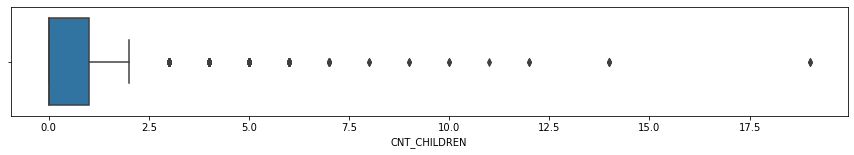

In [80]:
#plotting box plot to check for outliers
plt.figure(figsize = (15,2))
sns.boxplot(numeric_data.CNT_CHILDREN)
plt.show()

In [81]:
#finding out the 99% for CNT_CHILDREN
numeric_data.CNT_CHILDREN.quantile(.99)

3.0

In [82]:
print(numeric_data.CNT_CHILDREN.quantile(.99))
print('Number rows > 99 per:',len(numeric_data[numeric_data.CNT_CHILDREN>3]))

3.0
Number rows > 99 per: 555


- Assuming the in India number of children in a family does not average out to be more than 5 hence substituting the outliers with 5 to normalize the column

In [83]:
app.loc[app['CNT_CHILDREN'] > 4, ['CNT_CHILDREN']] = 5

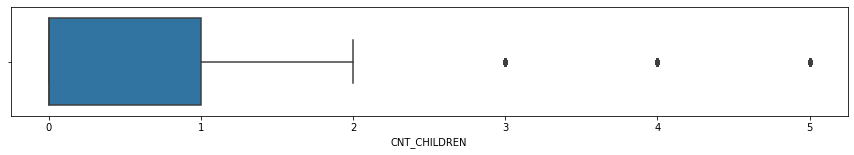

In [84]:
#replotting to check the normalized form of the CNT_CHILDREN 
plt.figure(figsize = (15,2))
sns.boxplot(app.CNT_CHILDREN)
plt.show()

In [85]:
numeric_data.CNT_CHILDREN.describe()

count    307511.000000
mean          0.417052
std           0.722121
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max          19.000000
Name: CNT_CHILDREN, dtype: float64

**AMT_INCOME_TOTAL**

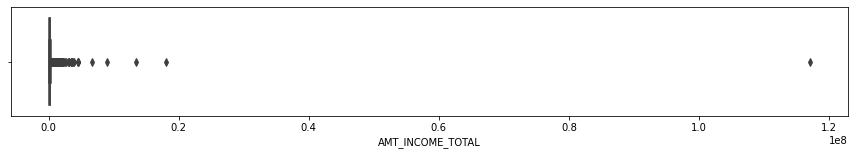

In [86]:
#Plotting AMT_INCOME_TOTAL with a box plot to check for outliers
plt.figure(figsize = (15,2))
sns.boxplot(app.AMT_INCOME_TOTAL)
plt.show()

In [87]:
app.AMT_INCOME_TOTAL.describe()

count    3.075110e+05
mean     1.687979e+05
std      2.371231e+05
min      2.565000e+04
25%      1.125000e+05
50%      1.471500e+05
75%      2.025000e+05
max      1.170000e+08
Name: AMT_INCOME_TOTAL, dtype: float64

In [88]:
print('75%     :',2.025000e+05)
print('max    :',1.170000e+08)

75%     : 202500.0
max    : 117000000.0


In [89]:
#checking for 99% for AMT_INCOME_TOTAL
app.AMT_INCOME_TOTAL.quantile(.99)

472500.0

- there is huge difference between MAX value and the 99% value

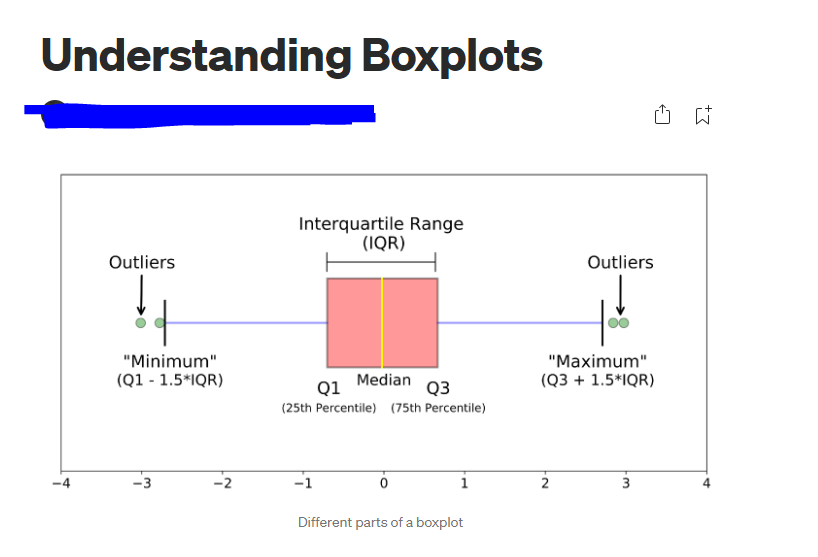

In [90]:
#Calculating Outlier value for AMT_INCOME_TOTAL using the above formula given in the picture
iqr=app.AMT_INCOME_TOTAL.quantile(0.75)-app.AMT_INCOME_TOTAL.quantile(0.25)
AMT_INCOME_TOTAL_OUTLIER=app.AMT_INCOME_TOTAL.quantile(0.75)+(iqr*1.5)
AMT_INCOME_TOTAL_OUTLIER

337500.0

- Inference : Since AMT_INCOME_TOTAL outlier is 337500 and 99th percentile is 472500 .Meaning income from 337500.0 to 472500.0 is still a norm but anything above 472500.0 will lead to a bias in average of the income. Hence replacing the values higher than 472500.0 with 472500.0+10000.0 to make it continuous and distinctly identifiable.

In [91]:
app.loc[app.AMT_INCOME_TOTAL > 472500.0, ['AMT_INCOME_TOTAL']] = 472500.0+10000

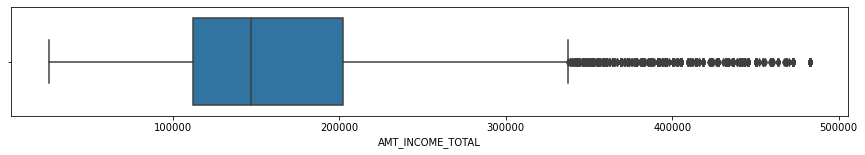

In [92]:
#replotting to check the normalized form of AMT_INCOME_TOTAL
plt.figure(figsize = (15,2))
sns.boxplot(app.AMT_INCOME_TOTAL)
plt.show()

In [93]:
#Binning AMT_INCOME_TOTAL into income range categories
app['IncomeRange'] = pd.qcut(app['AMT_INCOME_TOTAL'], q=[0,0.25,0.50,0.90,1], labels=['Low','Average','High','Very High'])

In [94]:
app.shape

(307511, 36)

In [95]:
app.IncomeRange.head()

0       High
1       High
2        Low
3    Average
4    Average
Name: IncomeRange, dtype: category
Categories (4, object): ['Low' < 'Average' < 'High' < 'Very High']

**AMT_CREDIT**

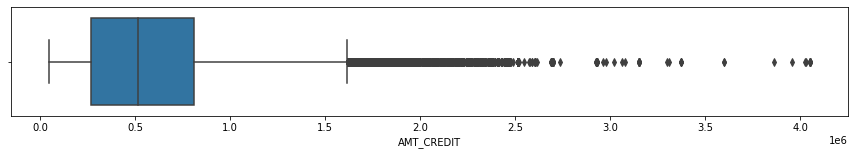

In [96]:
#Plotting AMT_CREDIT with a box plot to check for outliers
plt.figure(figsize = (15,2))
sns.boxplot(app.AMT_CREDIT)
plt.show()

In [97]:
app.AMT_CREDIT.describe()

count    3.075110e+05
mean     5.990260e+05
std      4.024908e+05
min      4.500000e+04
25%      2.700000e+05
50%      5.135310e+05
75%      8.086500e+05
max      4.050000e+06
Name: AMT_CREDIT, dtype: float64

In [98]:
print('75%        :',8.086500e+05)
print('max        :',4.050000e+06)

75%        : 808650.0
max        : 4050000.0


In [99]:
#Calculating 99% for AMT_CREDIT
app.AMT_CREDIT.quantile(.99)

1854000.0

In [100]:
#Calculating OUTLIERS for AMT_CREDIT using Outlier formula
iqr = app.AMT_CREDIT.quantile(.75) - app.AMT_CREDIT.quantile(.25)
amt_cre_outlier =  app.AMT_CREDIT.quantile(.75) + (iqr*1.5)
print(amt_cre_outlier)

1616625.0


- Inference : Since 'amt_cre_outlier' outlier is 1616625.0 and 99th percentile is 1854000.0 .Meaning credit amount of loan from 1616625.0 to 1854000.0 is still a norm but anything above 1854000.0 will lead to a bias in average of credit amount of loan. Hence replacing the values higher than 1854000.0 with 1854000.0+10000.0 to make it continuous and distinctly identifiable.

In [101]:
app.loc[app.AMT_CREDIT > 1854000.0 , ['AMT_CREDIT'] ] =1854000.0 + 10000.0

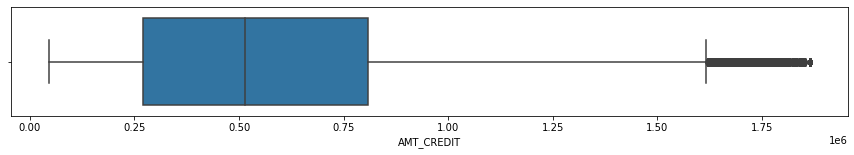

In [102]:
# RePlotting for AMT_CREDIT to see the normalized version.
plt.figure(figsize = (15,2))
sns.boxplot(app.AMT_CREDIT)
plt.show()

In [103]:
numeric_data.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,Age
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307511.000000,3.075110e+05,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.487841,5.383163e+05,0.020868,67724.742149,4986.120328,2994.202373,2.152664,2.052463,2.031521,12.063419,0.015144,0.050769,0.040659,0.078173,0.230454,0.179555,43.405137
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.461065,3.692890e+05,0.013831,139443.751806,3522.886321,1509.450419,0.910679,0.509034,0.502737,3.265832,0.122126,0.219526,0.197499,0.268444,0.421124,0.383817,11.945779
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,20.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,933.000000,2010.000000,1720.000000,2.000000,2.000000,2.000000,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,33.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,2219.000000,4504.000000,3254.000000,2.000000,2.000000,2.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,43.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,5707.000000,7479.500000,4299.000000,3.000000,2.000000,2.000000,14.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,53.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,365243.000000,24672.000000,7197.000000,20.000000,3.000000,3.000000,23.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,69.000000


**AMT_ANNUITY**

In [104]:
app.AMT_ANNUITY.describe()

count    307511.000000
mean      27108.487841
std       14493.461065
min        1615.500000
25%       16524.000000
50%       24903.000000
75%       34596.000000
max      258025.500000
Name: AMT_ANNUITY, dtype: float64

In [105]:
#Finding the 99% for AMT_ANNUITY
app.AMT_ANNUITY.quantile(.99)

70006.5

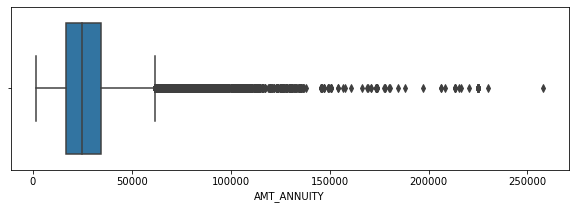

In [106]:
plt.figure(figsize = (10,3))
sns.boxplot(app.AMT_ANNUITY)
plt.show()

In [107]:
#calculating outliers using the formula
iqr = app.AMT_ANNUITY.quantile(.75) - app.AMT_ANNUITY.quantile(.25)
AMT_ANNUITY_Outlier = app.AMT_ANNUITY.quantile(.75) + (1.5*iqr)
print(AMT_ANNUITY_Outlier)

61704.0


- Inference : Since 'AMT_ANNUITY_Outlier' outlier is 61704.0 and 99th percentile is 70006.5 .Meaning loan annuity from 61704.0 to 70006.5 is still a norm but anything above 70006.5 will lead to a bias in average of loan annuity. Hence replacing the values higher than 70006.5 with 70006.5 +10000.0 to make it continuous and distinctly identifiable.

In [108]:
app.loc[app.AMT_ANNUITY > 70006.5,['AMT_ANNUITY']] = 70006.5 + 10000.0

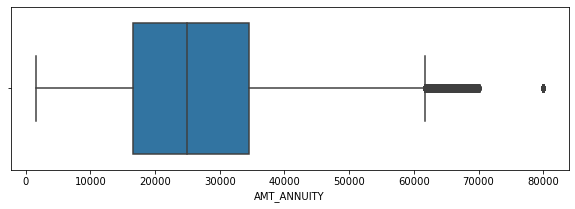

In [109]:
#Replotting to see the normalized form of AMT_ANNUITY
plt.figure(figsize = (10,3))
sns.boxplot(app.AMT_ANNUITY)
plt.show()

**CNT_FAM_MEMBERS**

In [110]:
#Statistics of CNT_FAM_MEMBERS
print(app.CNT_FAM_MEMBERS.describe())
print('99%          ',app.CNT_FAM_MEMBERS.quantile(.99))
print('Number of values with rows more than 99 percentile:',len(app[app.CNT_FAM_MEMBERS>app.CNT_FAM_MEMBERS.quantile(.99)]))

count    307511.000000
mean          2.152664
std           0.910679
min           1.000000
25%           2.000000
50%           2.000000
75%           3.000000
max          20.000000
Name: CNT_FAM_MEMBERS, dtype: float64
99%           5.0
Number of values with rows more than 99 percentile: 529


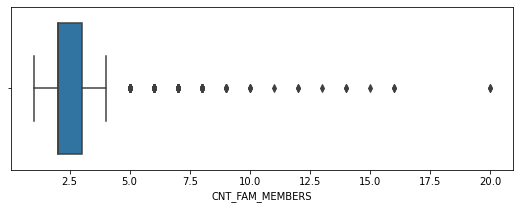

In [111]:
#Plotting box plot for CNT_FAM_MEMBERS
plt.figure(figsize = (9,3))
sns.boxplot(app.CNT_FAM_MEMBERS)
plt.show()

- There is a huge dufference between values with 99 percentile of family members count and the maximum number. Hence replacing the rows with value more than 5 with 6(since 6 is almost 75 percentile number of members in a family after 99 percentile values)

In [112]:
app.loc[app['CNT_FAM_MEMBERS'] > 5, ['CNT_FAM_MEMBERS']] = 6

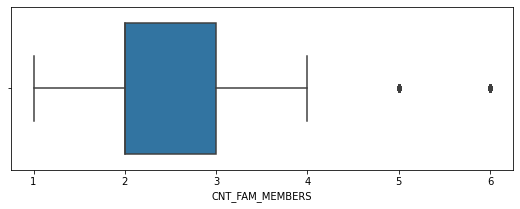

In [113]:
#Replotting to see the normalized version of CNT_FAM_MEMBERS
plt.figure(figsize = (9,3))
sns.boxplot(app.CNT_FAM_MEMBERS)
plt.show()

In [114]:
numeric_data.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,Age
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307511.000000,3.075110e+05,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.487841,5.383163e+05,0.020868,67724.742149,4986.120328,2994.202373,2.152664,2.052463,2.031521,12.063419,0.015144,0.050769,0.040659,0.078173,0.230454,0.179555,43.405137
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.461065,3.692890e+05,0.013831,139443.751806,3522.886321,1509.450419,0.910679,0.509034,0.502737,3.265832,0.122126,0.219526,0.197499,0.268444,0.421124,0.383817,11.945779
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,20.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,933.000000,2010.000000,1720.000000,2.000000,2.000000,2.000000,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,33.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,2219.000000,4504.000000,3254.000000,2.000000,2.000000,2.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,43.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,5707.000000,7479.500000,4299.000000,3.000000,2.000000,2.000000,14.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,53.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,365243.000000,24672.000000,7197.000000,20.000000,3.000000,3.000000,23.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,69.000000


**AMT_GOODS_PRICE**

In [115]:
print(app.AMT_GOODS_PRICE.describe())
print('99%',app.AMT_GOODS_PRICE.quantile(.99))
print('75% ',6.795000e+05)
print('MAX',4.050000e+06)

#Finding Outliers for AMT_GOODS_PRICE using the formula
iqr = app.AMT_GOODS_PRICE.quantile(.75) - app.AMT_GOODS_PRICE.quantile(.25)
gp_out = app.AMT_GOODS_PRICE.quantile(.75) + (1.5 * iqr)
print('Outliers',gp_out)

count    3.075110e+05
mean     5.383163e+05
std      3.692890e+05
min      4.050000e+04
25%      2.385000e+05
50%      4.500000e+05
75%      6.795000e+05
max      4.050000e+06
Name: AMT_GOODS_PRICE, dtype: float64
99% 1800000.0
75%  679500.0
MAX 4050000.0
Outliers 1341000.0


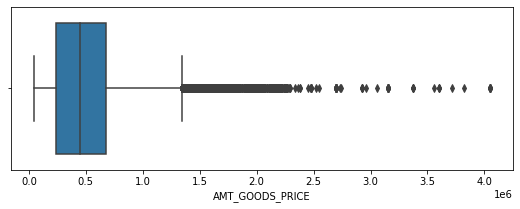

In [116]:
#Plotting box plot for AMT_GOODS_PRICE 
plt.figure(figsize = (9,3))
sns.boxplot(app.AMT_GOODS_PRICE)
plt.show()

Inference : Since 'gp_out' outlier is 1341000.0 and 99th percentile is 1800000.0 .Meaning average price of good from 1341000.0 to 1800000.0 is still a norm but anything above 1800000.0 will lead to a bias in average of average price of good. Hence replacing the values higher than 1800000.0  with 1800000.0 +10000.0 to make it continuous and distinctly identifiable.

In [117]:
app.loc[app.AMT_GOODS_PRICE > 1800000.0 ,['AMT_GOODS_PRICE']]= 1800000.0+10000.0

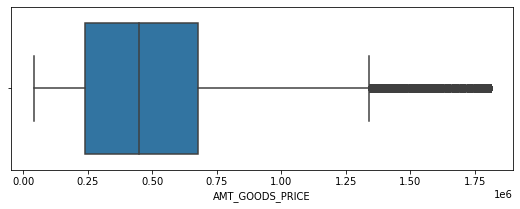

In [118]:
#replotting for AMT_GOODS_PRICE to see the normalized version
plt.figure(figsize = (9,3))
sns.boxplot(app.AMT_GOODS_PRICE)
plt.show()

**DAYS_EMPLOYED**

In [119]:
print(app.DAYS_EMPLOYED.describe())
print('99%',app.DAYS_EMPLOYED.quantile(.99))

#Finding Outliers for DAYS_EMPLOYED using the formula

iqr = app.DAYS_EMPLOYED.quantile(.75) - app.DAYS_EMPLOYED.quantile(.25)
de_out = app.DAYS_EMPLOYED.quantile(.75) + (1.5 * iqr)
print('Outliers',de_out)

count    307511.000000
mean      67724.742149
std      139443.751806
min           0.000000
25%         933.000000
50%        2219.000000
75%        5707.000000
max      365243.000000
Name: DAYS_EMPLOYED, dtype: float64
99% 365243.0
Outliers 12868.0


In [120]:
#Finding the number of rows with outliers
print(len(app[app.DAYS_EMPLOYED>12868.0]))

56357


- Inference: dividing 99% with 365(365243/365=1000).Employment for these many years is not possible. With univariate and bivariate analysis it can be analyzed if people are having difficulty to make a payment gives this kind of vague values or these are just missing values. Hence not treating the outlier right now.

In [121]:
365243/365

1000.6657534246575

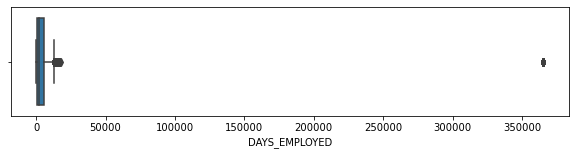

In [122]:
#Plotting graph for DAYS_EMPLOYED 
plt.figure(figsize = (10,2))
sns.boxplot(app.DAYS_EMPLOYED)
plt.show()

**Analysis for the ‘Target variable’ in the dataset**

In [123]:
categoric_data.head()

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,AgeGroup
0,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,"(20, 30]"
1,Cash loans,F,N,N,Family,State servant,Higher education,Married,House / apartment,Core staff,MONDAY,School,"(40, 50]"
2,Revolving loans,M,Y,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,MONDAY,Government,"(50, 60]"
3,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,"(50, 60]"
4,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Core staff,THURSDAY,Religion,"(50, 60]"


In [124]:
#Identifying the data imbalance.
app.TARGET.value_counts(normalize=True)*100

0    91.927118
1     8.072882
Name: TARGET, dtype: float64

Target=0 denotes people not defaulting on loans and Target= 1 People defaulting on loans

In [125]:
#Finding the ratio of the imbalance data i.e people defaulting on loans by people not defaulting on loans
print('ratio of Imbalance(8.07:91.92)= ',8.072882/91.927118)

ratio of Imbalance(8.07:91.92)=  0.08781828665617473


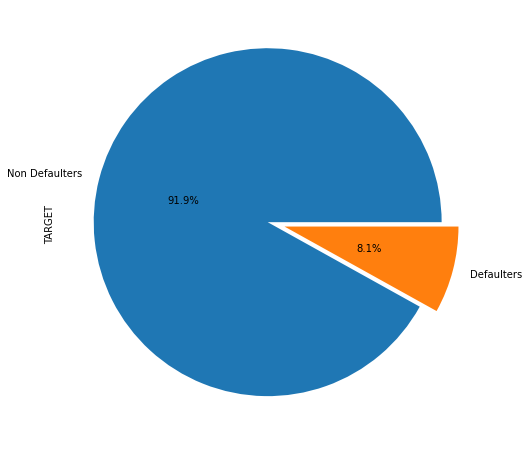

In [126]:
#Creating a pie chart to show the percentage of defaulters vs non defaulters
plt.figure(figsize=[20,8])
label=['Non Defaulters','Defaulters']
(app.TARGET.value_counts(normalize=True)*100).plot.pie(explode=[0.05]*2,autopct="%.1f%%", labels=label,pctdistance=0.5)
plt.show()


**Creating two dataframes for Target = 0 and Target = 1 for univariate and bivariate analysis.**

In [127]:
categoric_data.shape

(307511, 13)

In [128]:
app_t0 = app[app.TARGET == 0]

In [129]:
app_t1 = app[app.TARGET == 1]

In [130]:
print(app_t0.shape)
print(app_t1.shape)

(282686, 36)
(24825, 36)


# <font color = 'Red'> Univariate Analysis</font>
REFERENCE
- nt, (int, int, *index*), or `.SubplotSpec`, default: (1, 1, 1)
    The position of the subplot described by one of

    - Three integers (*nrows*, *ncols*, *index*).

REFERENCE
- Diff style plots 

- plt.style.use('ggplot')
- plt.style.use('fivethirtyeight')
- plt.style.use('Solarize_Light2')
- plt.style.use('dark_background')
- plt.style.use('classic')


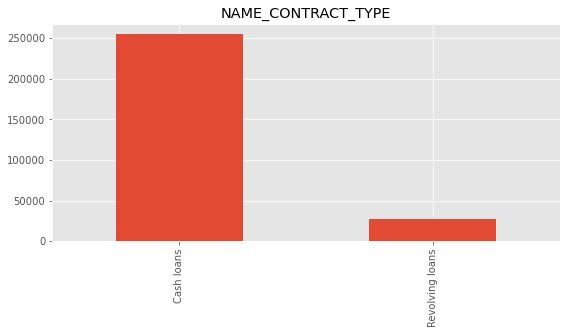

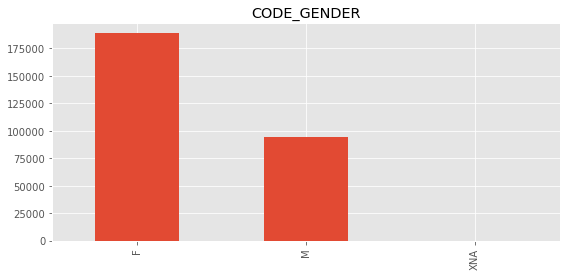

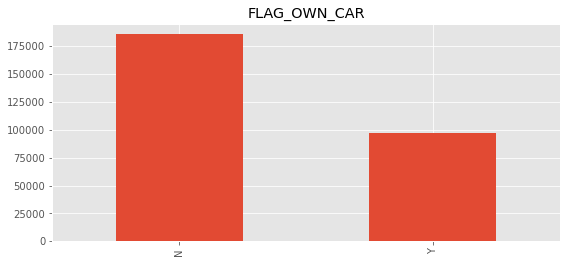

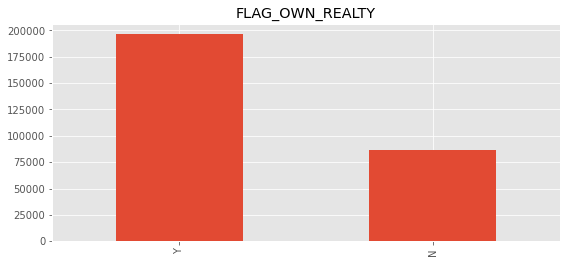

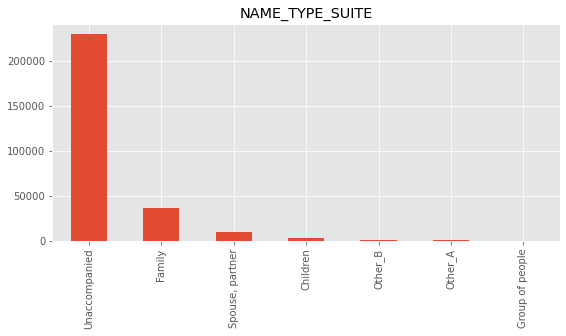

...

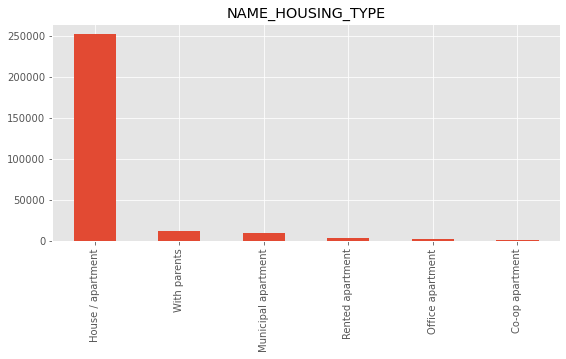

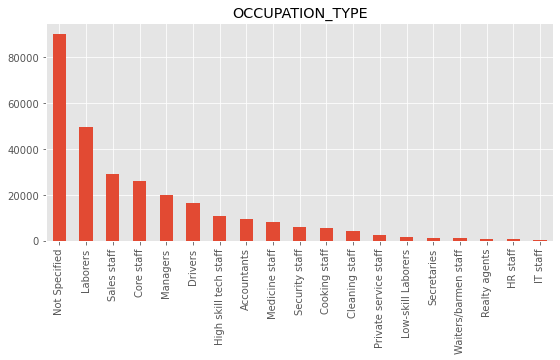

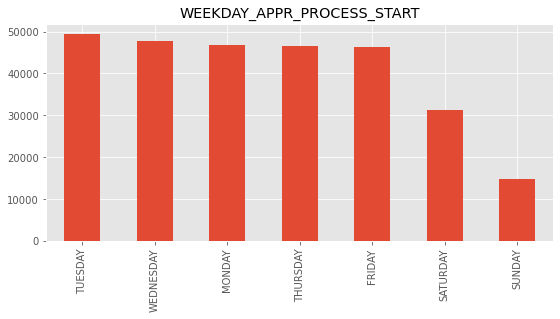

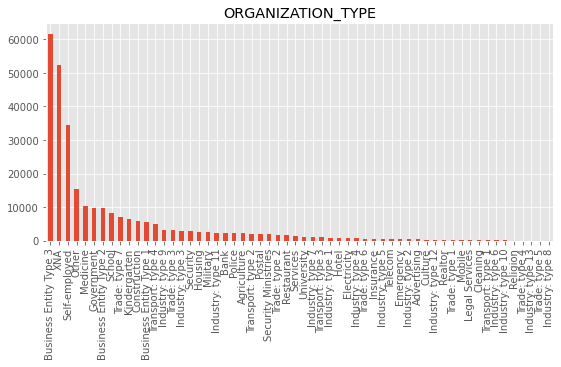

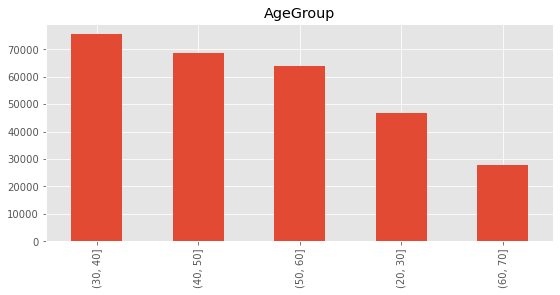

In [131]:
# Selecting the categorical columns for applicants who made payment on time.
plt.style.use('ggplot')
# Plotting a bar chart for each of the cateorical variable
for col in categoric_data:
    plt.figure(figsize=[20,4])
    plt.subplot(1,2,1)
    app_t0[col].value_counts().plot.bar()
    plt.title(col)

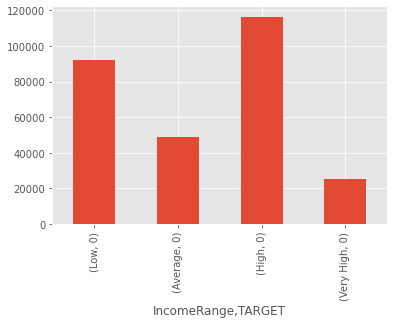

In [132]:
#Plotting graph for 'IncomeRange' separately instead of using a for loop.
app_t0.groupby('IncomeRange')['TARGET'].value_counts().plot.bar()
plt.show()

**Inference : Univariate Analyis of applicants making payment of time**
- More than 250000 applicants have applied for Cash loans and very small proportion of people have applied for Revolving loans.
- Number of females(approx 175000) who applied for loan are more than the number of males(approx 100000).Very few applicants belong to the third gender
- Less number of applicants who have applied for loan own a car(approx 175000)
- More number of applicants who have applied for loan own a property(aprrox 190000)
- Approx 250000 people who applied for loans were unaccompanied. The difference between the unaccompanied and family is a lot and the rest are almost negligible.
- More than 140000 people are working professionals.Commercial associates and pensioners were next in line after working professionals
- Applicants who took max loan was for secondary/special education(approx 200000) followed by higher education and incomplete higher.
- Married people(approx lil more than 175000) took maximum loans in comparison to single,civil or separated
- Approx 250000 people took the maximum loan had a house/ appartment followed by people living with parents , had municipal or had rented apartments. 
- Most of the people who opted for loan, didn't mention their occupation type. Other high number of people who applied for loans are labourers, Sales Staff and Drivers.
- Tuesdays saw maximum flow of loan application and rest of the weekdays showed a consistent outflow of loan application. Weekends did not see a lot of applications in comparison to weekdays
- Most of the people who applied for loans either work in Business Entity type 2 kind of organizations and the other top 2 are unknown types and Self-employed respectively.
- More than 70000 people belonged to the age group of 30-40 years who had applied for loans followed by those belonging to 40-50 and 50-60
- There are relatively few people with very high income or average who have applied for loans but most of them who have applied for loans either have high income or low income.

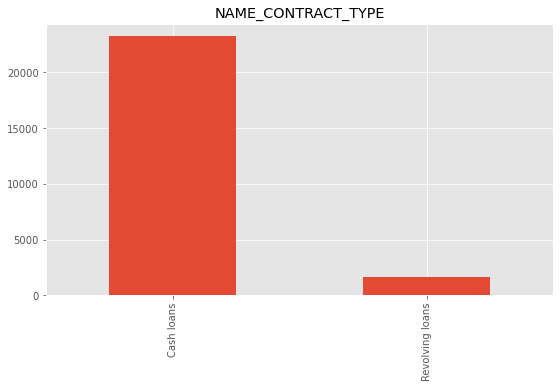

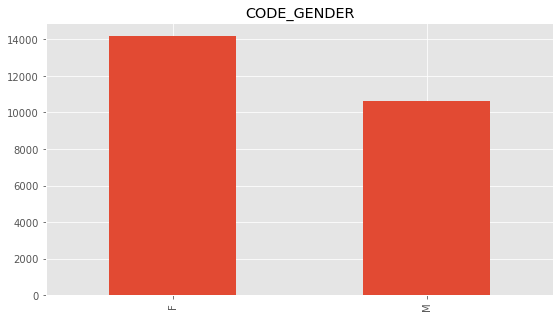

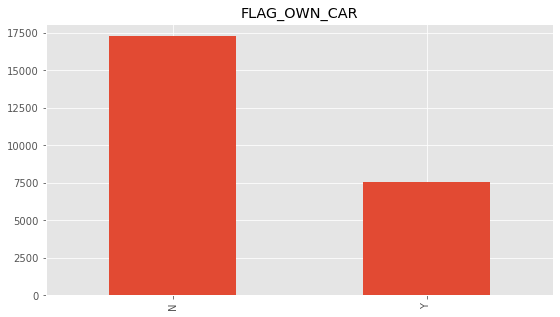

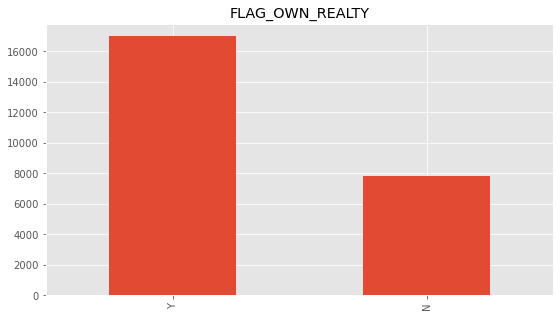

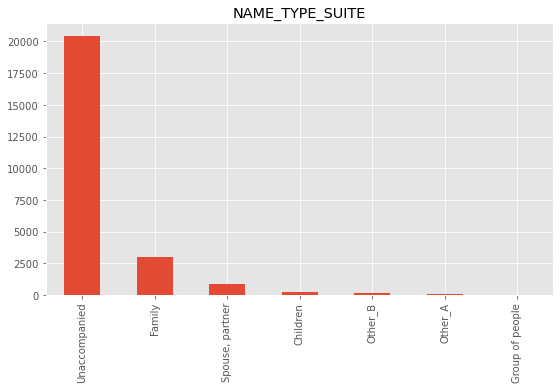

...

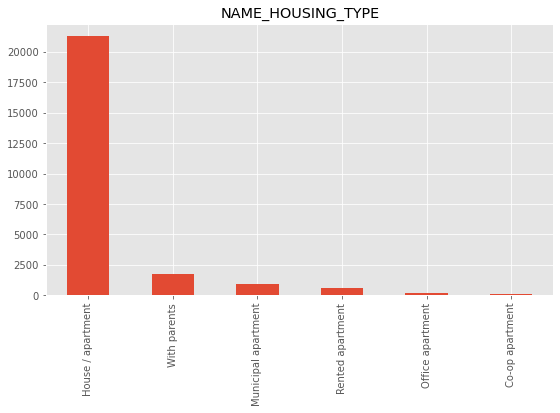

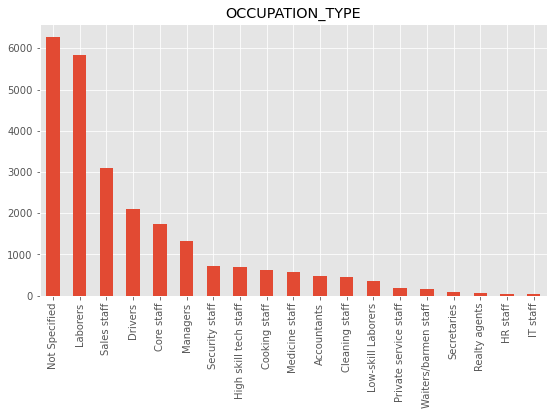

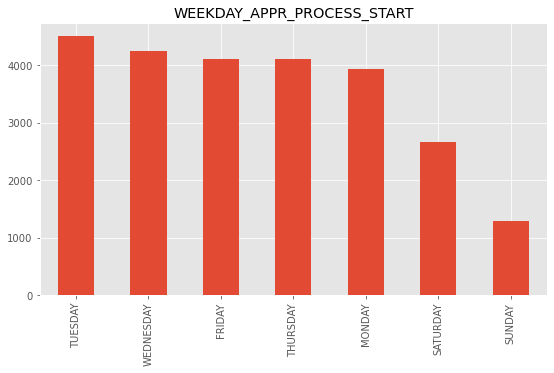

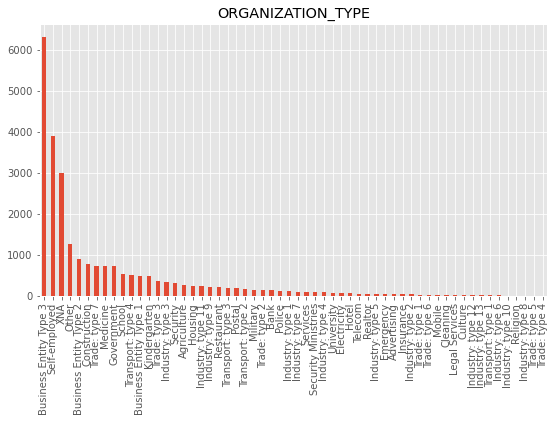

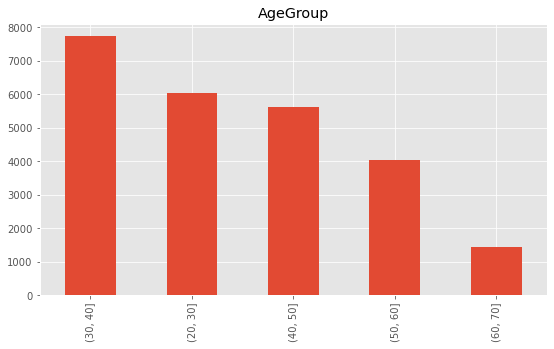

In [133]:
# Selecting the categorical columns for applicants who did not make payment on time.
# Plotting a bar chart for each of the categorical variable
for c in categoric_data:
    plt.figure(figsize=[20,5])
    plt.subplot(1,2,1)
    app_t1[c].value_counts().plot.bar()
    plt.title(c)

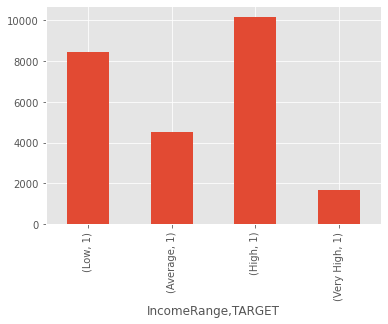

In [134]:
#Plotting graph for 'IncomeRange' separately instead of using a for loop.
app_t1.groupby('IncomeRange')['TARGET'].value_counts().plot.bar()
plt.show()

**Inference : Univariate Analyis of applicants not making payment of time**
- More than 20000 applicants applied for Cash Loans and very few applied for Revolving Loans
- More than 14000 applicants were female and a little more than 10000 applicants were male
- More number of applicants(approx 17500) did not own a car and approx 7500 owned a car.
- More number of applicants approx a little more than 16000 owned property
- Approx 20000 people who applied for loans were unaccompanied. The difference between the unaccompanied and family is a lot and the rest are almost negligible.
- More than 14000 people are working professionals.Commercial associates and pensioners were next in line after working professionals
- Applicants who took maximum loan was for secondary/special education(approx 19000) followed by higher education and incomplete higher.
- Married people(approx lil more than 14000) took maximum loans in comparison to single,civil or separated.
- More than 20000 people took the maximum loan had a house/ appartment followed by people living with parents , had municipal or had rented apartments
- Most of the people who opted for loan, didn't mention their occupation type. Other high number of people who applied for loans are labourers, Sales Staff and Drivers.
- Tuesdays saw maximum flow of loan application and rest of the weekdays showed a consistent outflow of loan application. Weekends did not see a lot of applications in comparison to weekdays
- Most of the people who applied for loans either work in Business Entity type 2 kind of organizations and the other top 2 are unknown types and Self-employed respectively.
- More than 70000 people belonged to the age group of 30-40 years who had applied for loans followed by those belonging to 40-50 and 50-60
- There are relatively few people with very high income or average who have applied for loans but most of them who have applied for loans either have high income or low income.

In [135]:
app_t0.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,Age,AgeGroup,IncomeRange
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,1188,1186.0,291,Core staff,2,1,1,MONDAY,11,0,0,0,0,0,0,School,45,"(40, 50]",High
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,225,4260.0,2531,Laborers,1,2,2,MONDAY,9,0,0,0,0,0,0,Government,52,"(50, 60]",Low
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,3039,9833.0,2437,Laborers,2,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,52,"(50, 60]",Average
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,3038,4311.0,3458,Core staff,1,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,54,"(50, 60]",Average
5,100008,0,Cash loans,M,N,Y,0,99000.0,490495.5,27517.5,454500.0,"Spouse, partner",State servant,Secondary / secondary special,Married,House / apartment,0.035792,1588,4970.0,477,Laborers,2,2,2,WEDNESDAY,16,0,0,0,0,0,0,Other,46,"(40, 50]",Low


# <font color = 'red'>Continous Variable</font>

In [136]:
numeric_data.columns

Index(['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'REGION_POPULATION_RELATIVE', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION',
       'DAYS_ID_PUBLISH', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'Age'],
      dtype='object')

- ##### SK_ID_CURR - ID of loan in our sample of application data

In [137]:
numeric_cols = list(numeric_data.columns)

In [138]:
print(type(numeric_cols))

<class 'list'>


In [139]:
#Removing SK_ID_CURR and TARGET from list numeric_cols
numeric_cols.remove('SK_ID_CURR')
numeric_cols.remove('TARGET')

In [140]:
#checking the statistics of app_t0
app_t0.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,Age
count,282686.000000,282686.0,282686.000000,282686.000000,2.826860e+05,282686.000000,2.826860e+05,282686.000000,282686.000000,282686.000000,282686.000000,282686.000000,282686.000000,282686.000000,282686.000000,282686.000000,282686.000000,282686.000000,282686.000000,282686.000000,282686.000000,282686.000000
mean,278244.744536,0.0,0.412543,166700.145003,5.997412e+05,27083.584148,5.408261e+05,0.021021,69668.812255,5029.941065,3017.219788,2.149395,2.043578,2.022449,12.086807,0.014942,0.050317,0.040494,0.074641,0.224090,0.175856,43.681958
std,102825.776954,0.0,0.714177,83980.376753,3.958250e+05,14151.607446,3.659872e+05,0.013978,140983.356991,3538.464478,1506.614090,0.901626,0.508422,0.501971,3.263173,0.121323,0.218599,0.197114,0.262812,0.416982,0.380698,11.946629
min,100003.000000,0.0,0.000000,25650.000000,4.500000e+04,1615.500000,4.050000e+04,0.000290,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,20.000000
25%,189103.250000,0.0,0.000000,112500.000000,2.700000e+05,16456.500000,2.385000e+05,0.010006,967.000000,2045.000000,1755.000000,2.000000,2.000000,2.000000,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,34.000000
50%,278362.500000,0.0,0.000000,148500.000000,5.177880e+05,24876.000000,4.500000e+05,0.018850,2304.000000,4544.000000,3295.000000,2.000000,2.000000,2.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,43.000000
75%,367241.500000,0.0,1.000000,202500.000000,8.100000e+05,34749.000000,6.850024e+05,0.028663,6074.000000,7550.000000,4313.000000,3.000000,2.000000,2.000000,14.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,54.000000
max,456255.000000,0.0,5.000000,482500.000000,1.864000e+06,80006.500000,1.810000e+06,0.072508,365243.000000,24672.000000,7197.000000,6.000000,3.000000,3.000000,23.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,69.000000


In [141]:
#checking the statistics of app_t1
app_t1.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,Age
count,24825.000000,24825.0,24825.000000,24825.000000,2.482500e+04,24825.000000,2.482500e+04,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.000000,24825.00000,24825.000000,24825.000000
mean,277449.167936,1.0,0.463001,159562.546405,5.565404e+05,26473.129366,4.882664e+05,0.019131,45587.324149,4487.127009,2732.099617,2.179899,2.153635,2.134824,11.797100,0.017442,0.055911,0.042538,0.118389,0.30292,0.221672,40.252931
std,102383.123458,0.0,0.750074,76583.631846,3.406644e+05,12379.260785,3.079756e+05,0.011905,118303.300421,3299.650241,1516.975313,0.943253,0.505052,0.499909,3.284299,0.130914,0.229755,0.201817,0.323074,0.45953,0.415380,11.474598
min,100002.000000,1.0,0.000000,25650.000000,4.500000e+04,2722.500000,4.500000e+04,0.000533,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,21.000000
25%,189555.000000,1.0,0.000000,112500.000000,2.844000e+05,17361.000000,2.385000e+05,0.009630,677.000000,1671.000000,1392.000000,2.000000,2.000000,2.000000,10.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,31.000000
50%,276291.000000,1.0,0.000000,135000.000000,4.975200e+05,25263.000000,4.500000e+05,0.018634,1458.000000,4056.000000,2797.000000,2.000000,2.000000,2.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,39.000000
75%,366050.000000,1.0,1.000000,202500.000000,7.333155e+05,32976.000000,6.750000e+05,0.025164,3280.000000,6646.000000,4119.000000,3.000000,2.000000,2.000000,14.000000,0.000000,0.000000,0.000000,0.000000,1.00000,0.000000,49.000000
max,456254.000000,1.0,5.000000,482500.000000,1.864000e+06,80006.500000,1.810000e+06,0.072508,365243.000000,22928.000000,6207.000000,6.000000,3.000000,3.000000,23.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,68.000000


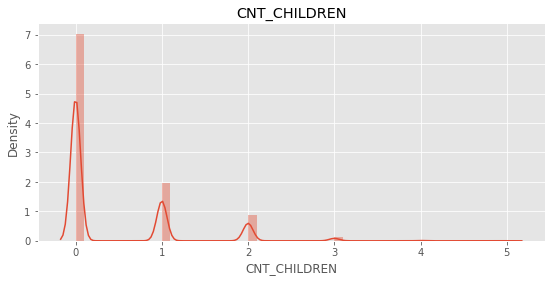

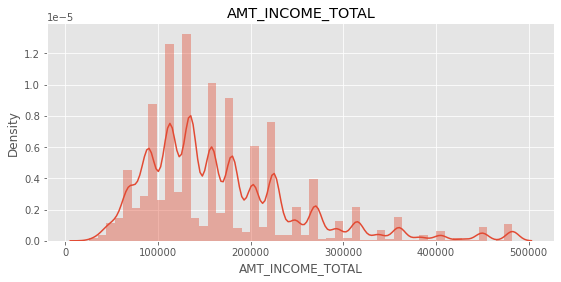

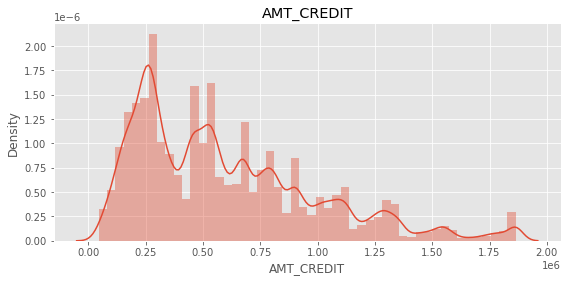

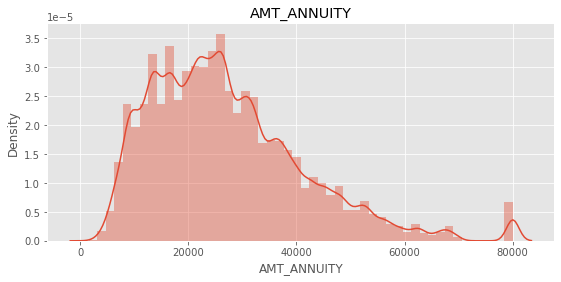

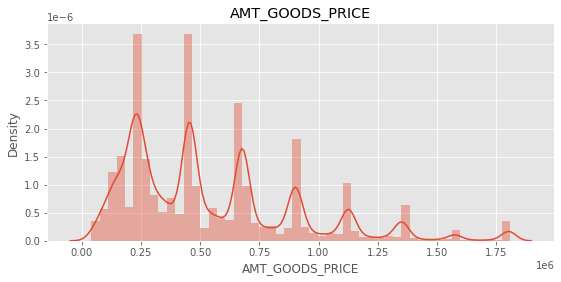

...

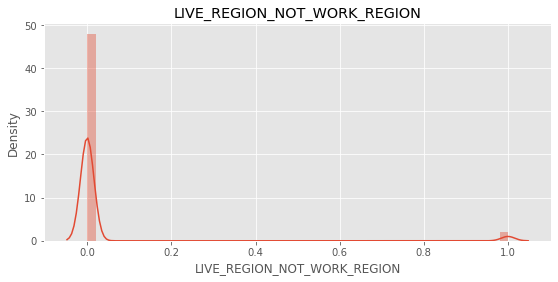

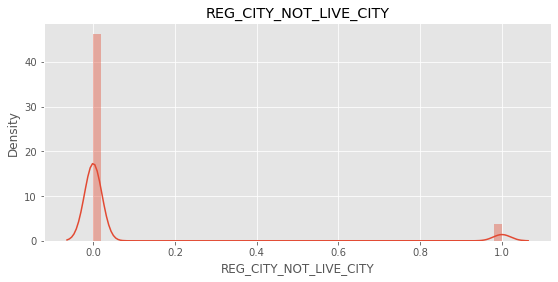

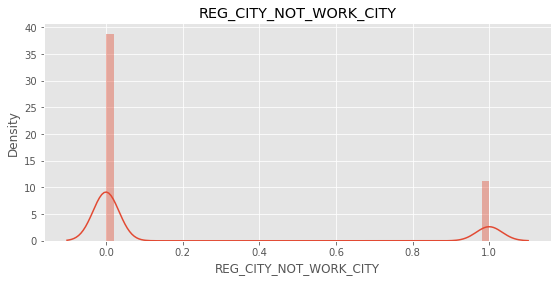

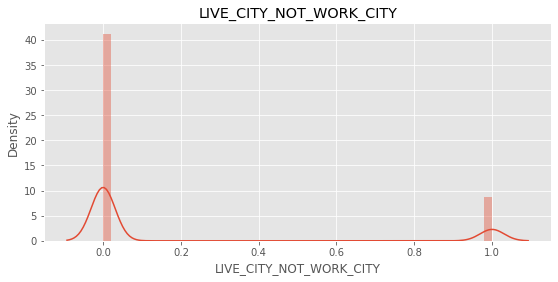

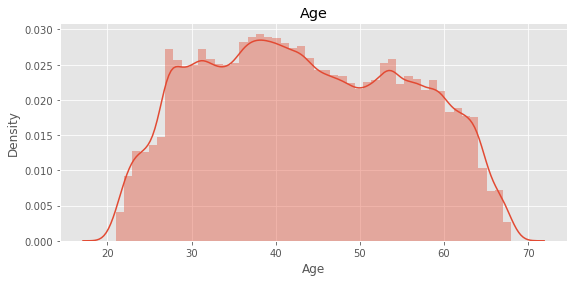

In [142]:
# Selecting the numeric columns for applicants who made payment on time.
# Plotting a distplot for each of the numeric variable
for col in numeric_cols:
    plt.figure(figsize=[20,4])
    plt.subplot(1,2,1)
    sns.distplot(app_t0[col])
    plt.title(col)

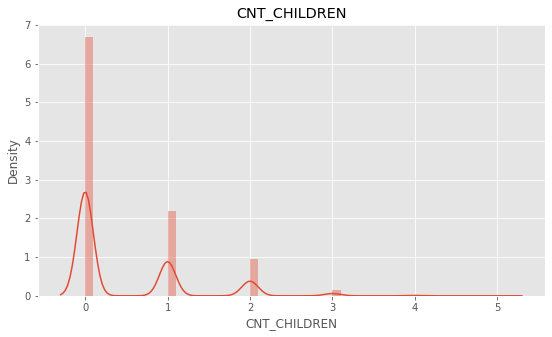

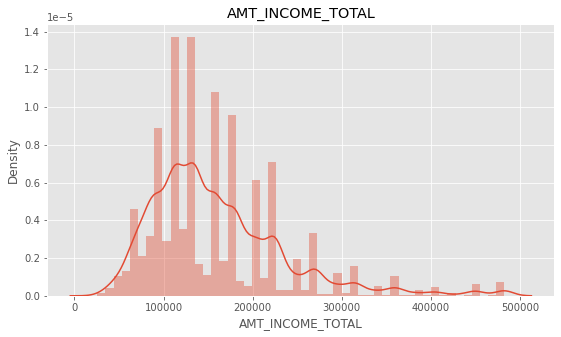

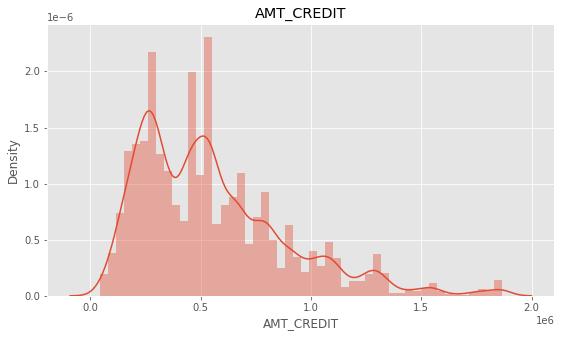

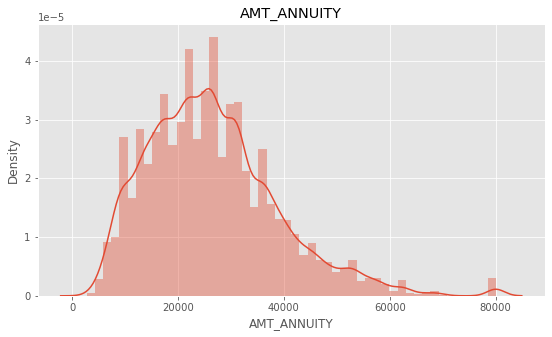

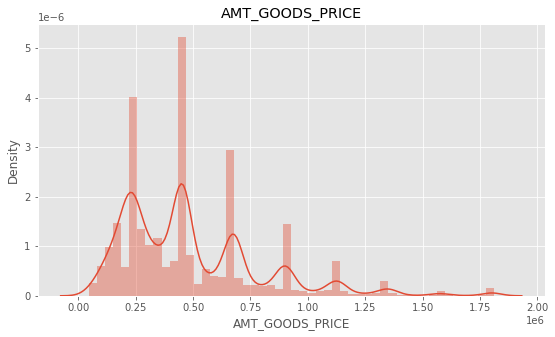

...

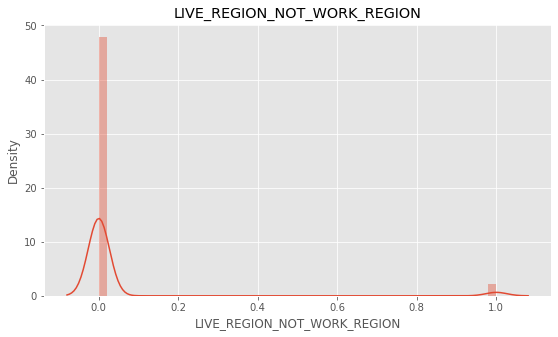

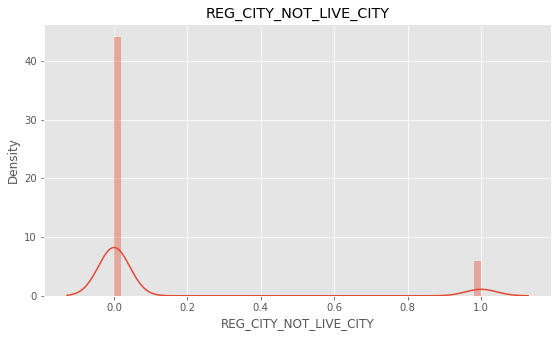

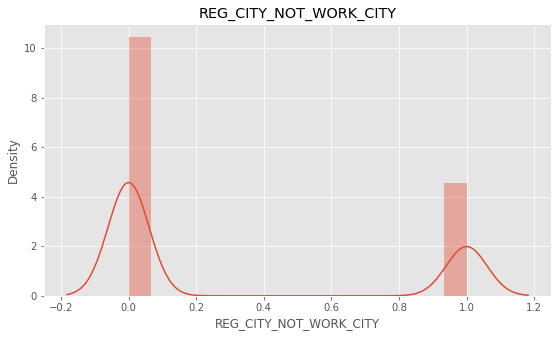

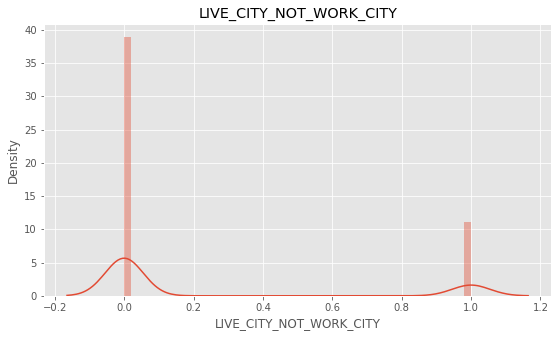

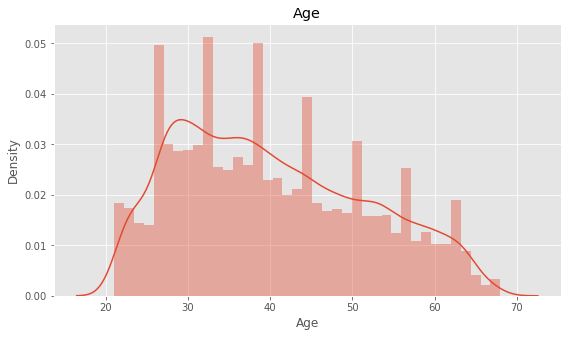

In [143]:
# Selecting the numeric columns for applicants who did not make the payment on time.
# Plotting a distplot for each of the numeric variable
for c in numeric_cols:
    plt.figure(figsize=[20,5])
    plt.subplot(1,2,1)
    sns.distplot(app_t1[c])
    plt.title(c)

**Inference**

- Family with less children number tend to apply for the loans and pay on time as well.
- People with low earning tend to apply for loans, accordingly from our AMT_INCOME_TOTAL plot that range would be between 1,00,000-2,00,000.
- Loans with such high credits are also paid.
- The graph for AMT_ANNUITY almost resembles a normal distribution with a **left** skew because of values with more than 32976.000000 in small amounts and the maximum value 71006.500000 in it.
- AMT_GOODS_PRICE, REGION_POPULATION_RELATIVE has no pattern.
-  Nothing can be derived from DAYS_EMPLOYED column either because of absurdness of its values.
- The density of applicants changing registration between 0-5000 days is the most and the density of applicants who changed the identity document with which he applied between 4000-4600 days is the most.
- The applicants mostly have 2 family members based on CNT_FAM_MEMBERS.
- REGION_RATING_CLIENT, REGION_RATING_CLIENT_W_CITY for most of the applicants is 2.
- Most of the applicants have applied between 10 AM-1PM
- All the columns REG_REGION_NOT_LIVE_REGION, REG_REGION_NOT_WORK_REGION, LIVE_REGION_NOT_WORK_REGION, REG_CITY_NOT_LIVE_CITY, REG_CITY_NOT_WORK_CITY, LIVE_CITY_NOT_WORK_CITY which checks the address given by the applicant is matching in most of the cases here.
- Age is almost evenly distributed with maximum density between 25-35.

In [144]:
app_t1.AMT_ANNUITY.describe()

count    24825.000000
mean     26473.129366
std      12379.260785
min       2722.500000
25%      17361.000000
50%      25263.000000
75%      32976.000000
max      80006.500000
Name: AMT_ANNUITY, dtype: float64

In [145]:
cate

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'AgeGroup'],
      dtype='object')

In [146]:
#checking for the column categorical
categorical = app.select_dtypes(exclude=np.number)

In [147]:
categorical.head(2)
cate_col = categorical.columns

In [148]:
cate_col

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'AgeGroup',
       'IncomeRange'],
      dtype='object')

**Bivariate and Multivariate Analysis**

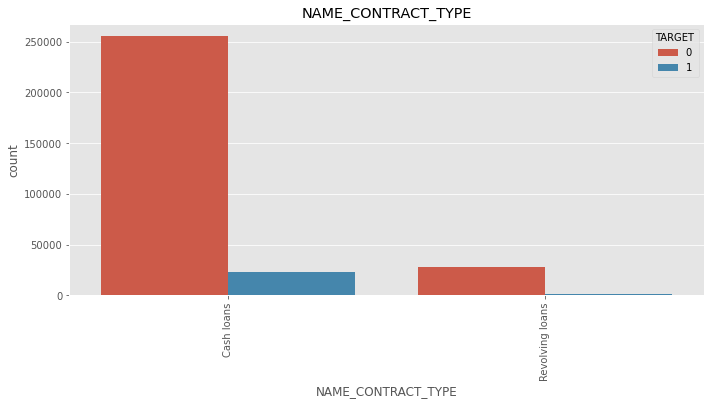

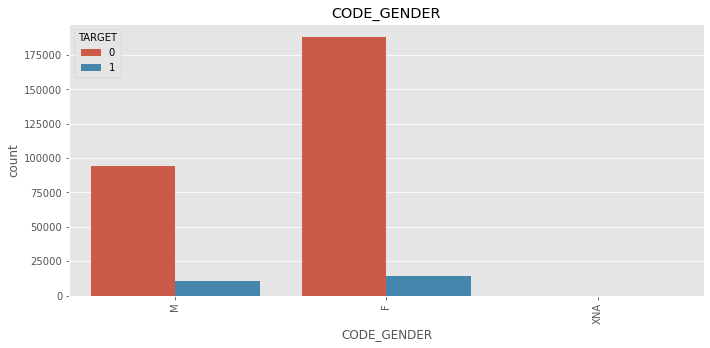

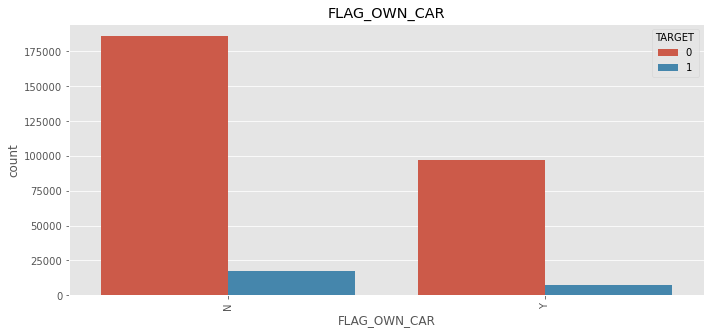

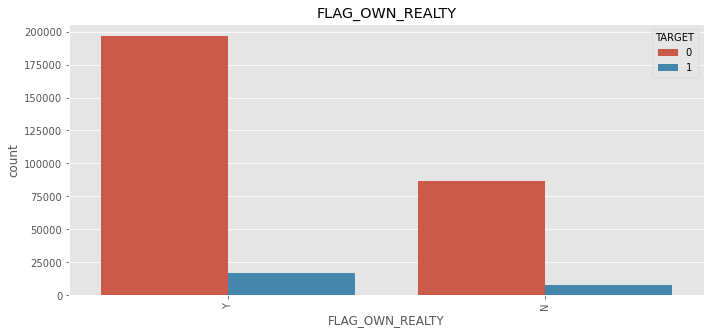

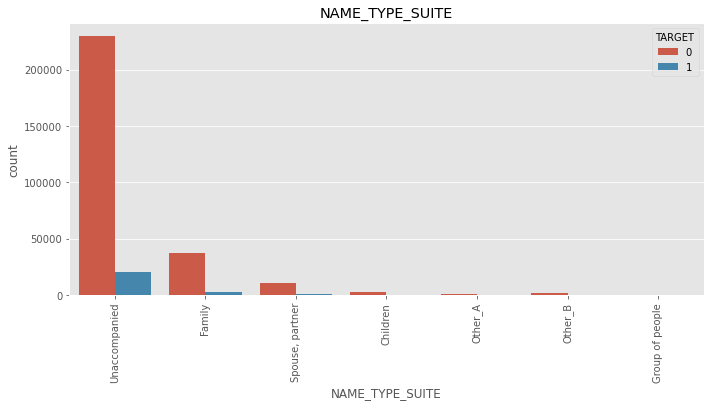

...

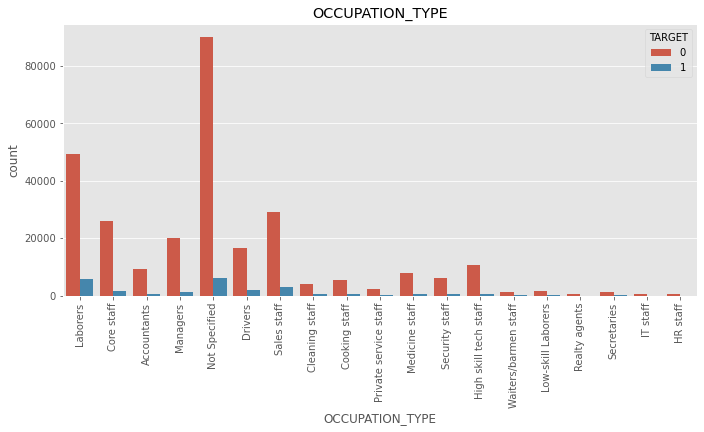

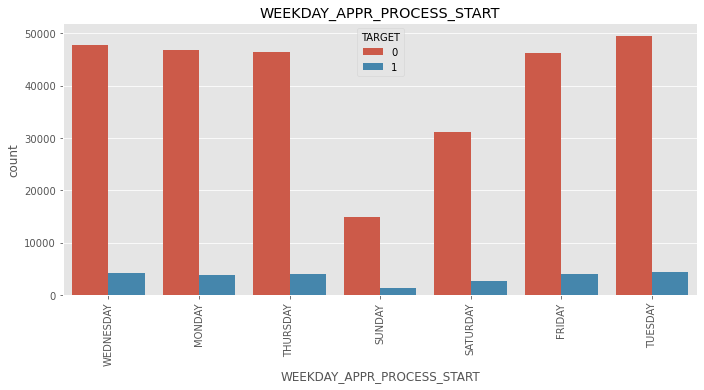

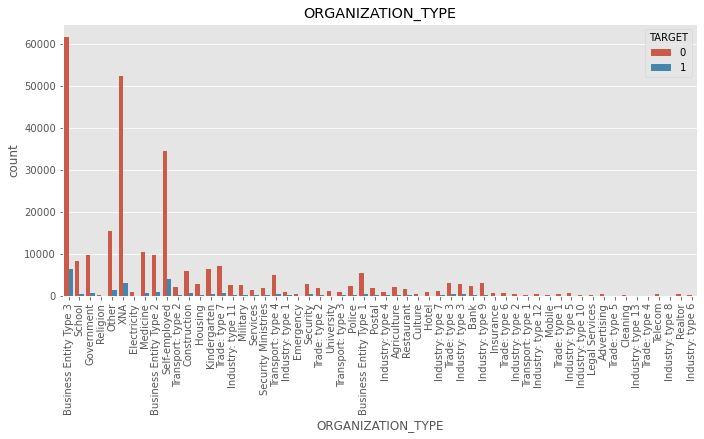

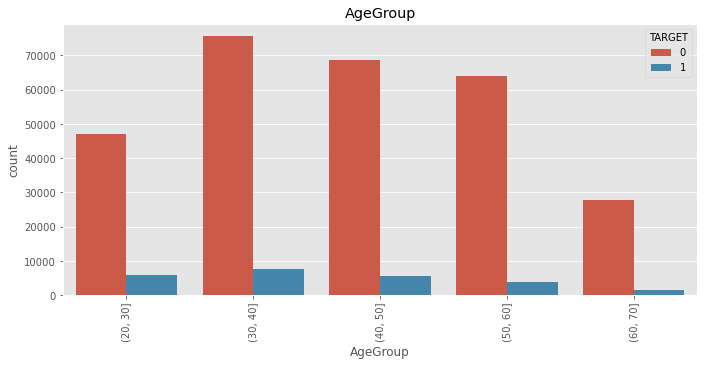

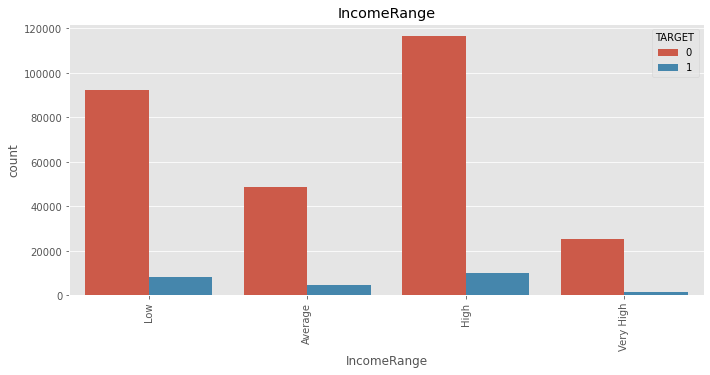

In [149]:
# Selecting the categorical columns for data set(applicantion data) 
# Plotting a countplot for each of the categorical variable
for c in cate_col:
    plt.figure(figsize=[25,5])
    plt.subplot(1,2,1)
    sns.countplot(data = app, hue = app.TARGET,x = app[c])
    plt.title(c)
    plt.xticks(rotation = 90)


**Inference**
- According to the graph, people opted more for Cash loans when compared with revolving loans.
- Females gender apply more loans in comparision to males. 
- The applicants having difficulties to pay back the loans mostly come unaccompanied while applying.
- The number of people in working class are more than any other category. But the number of people having difficulty to pay are also from working category people. 
- Applicants who are Secondary or special secondary educated have applied most of the loans but are also the population facing most of the difficulties while paying the amount in comparison to the rest.
- Married people apply for the most number of loans but also fail to pay loans on time.
- Applicants who have not specified their occupation type have some history to face difficulties. Must make it mandate to have proper history of the applicant verified before handing out loans to such category.
- From, the above graph, people belonging to organizations like Business entity type 3 have applied for the most number of loans respectively and most number of people having problems in paying back the amount is Business entity type 3.
- People in the age group 30-40, 40-50 and 50-60 have applied for the most number of loans but applicants in the age group 30-40 have difficulties to pay back the loans, might be because of the reason of having more family members to take care off.
- People with high income and low income have applied for the most number of loans respectively but people with low income and high income have almost same number of people facing difficulties to pay the loan which means the proportion of people having low income and applying for loans have most difficulties to pay the amount.

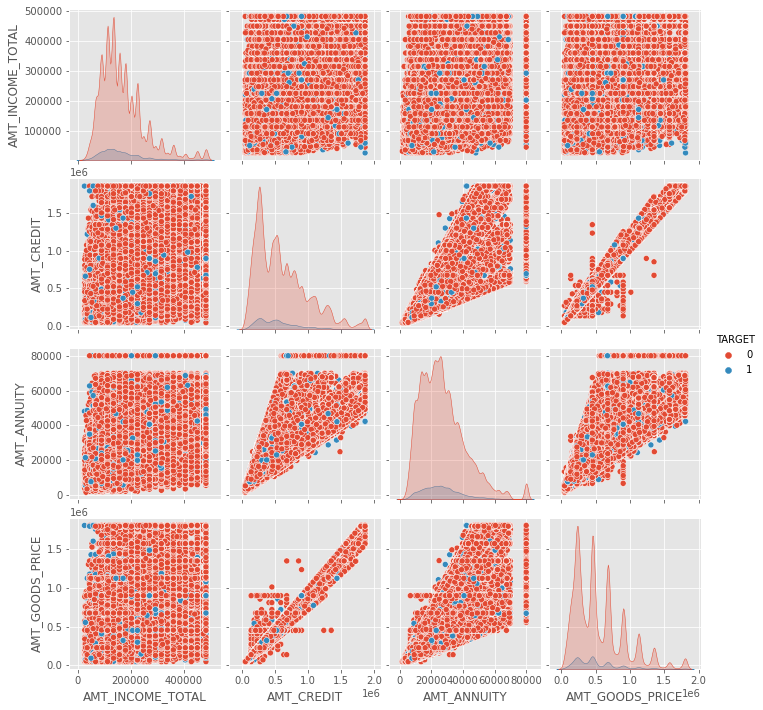

In [150]:
#Plotting a pairplot for different numeric columns along with target variable
sns_plot=sns.pairplot(data=app[['TARGET','AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE']], hue='TARGET')
plt.show()

It becomes difficult for applicant to pay if the 'AMT_CREDIT and AMT_ANNUITY' , 'AMT_CREDIT and AMT_Goods_price' , 'AMT_ANNUITY AND AMT_GOODS_PRICE' rises together.

'AMT_CREDIT and AMT_ANNUITY' , 'AMT_CREDIT and AMT_Goods_price' , 'AMT_ANNUITY AND AMT_GOODS_PRICE' have a rising relation if not completely linear relation with few exceptions

An increasing relationship is established between AMT_GOODS_PRICE and AMT_CREDIT.

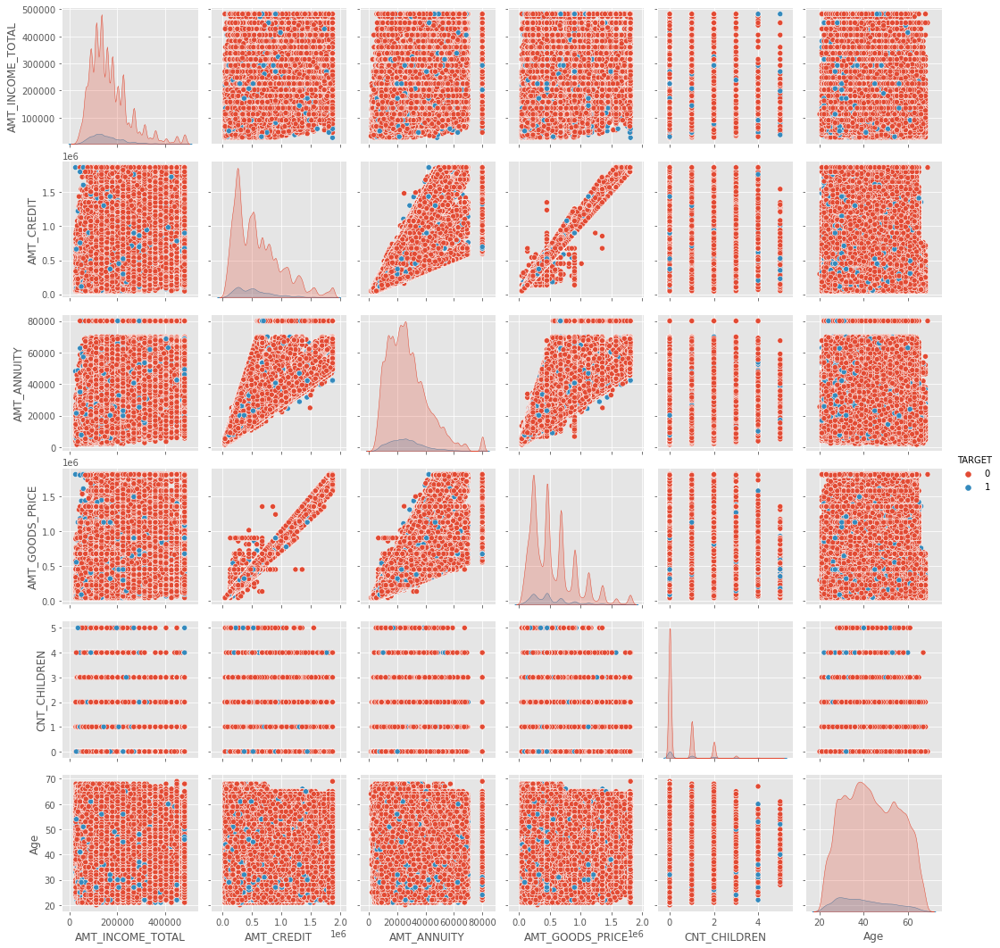

In [151]:
#Some more analysis of target variables with numeric columns
sns.pairplot(data=app[['TARGET','AMT_INCOME_TOTAL','AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE','CNT_CHILDREN','Age']], hue='TARGET')
plt.show()

With increasing count of children, the applicant starts facing payment problem irrespective of income, credit amount, annuity and goods price with an exception if the salary of applicant is very high and age is relatively high.

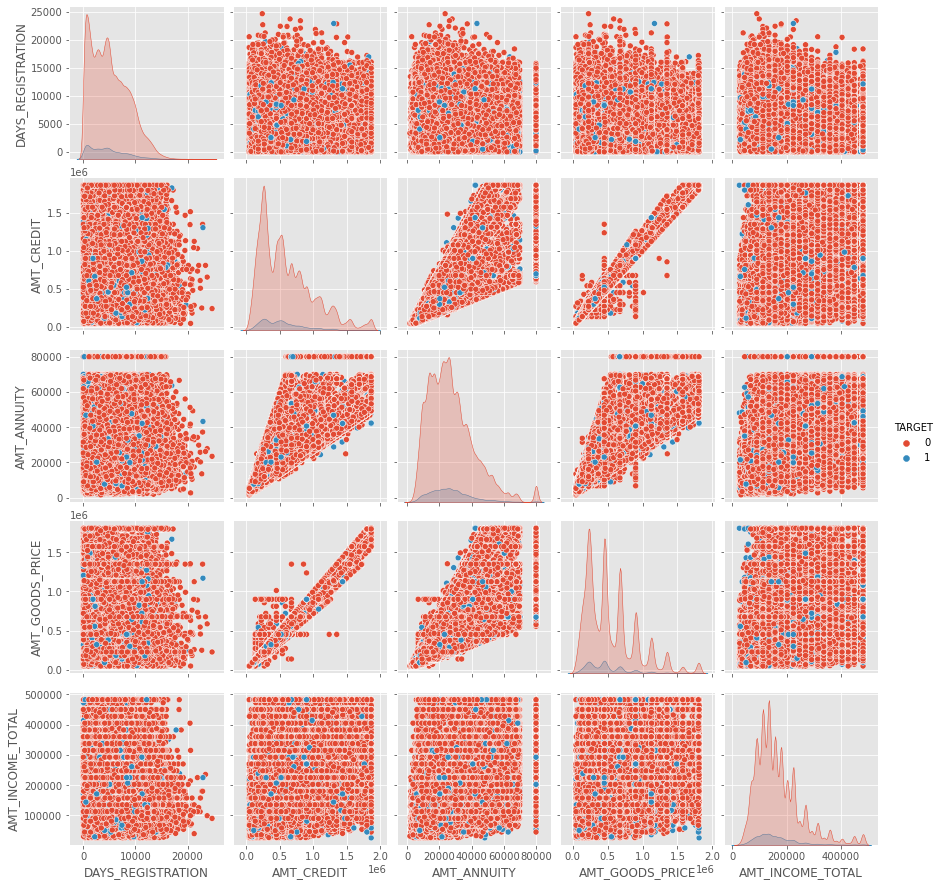

In [152]:
#Some more analysis of target variables with numeric columns
sns.pairplot(data=app[['TARGET','DAYS_REGISTRATION','AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE','AMT_INCOME_TOTAL']], hue='TARGET')
plt.show()

Larger the DAYS_REGISTRATION shows larger chances of getting payment of loan irrespective of AMT_INCOME_TOTAL,AMT_CREDIT, AMT_ANNUITY, AMT_GOODS_PRICE.

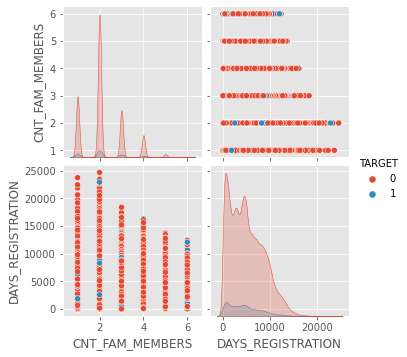

In [153]:
sns.pairplot(data=app[['TARGET','CNT_FAM_MEMBERS','DAYS_REGISTRATION']], hue='TARGET')
plt.show()

- Less family members and more days of registration leads to easy payment of loan amount.
- CNT_FAM_MEMBERS is not related to other variable.

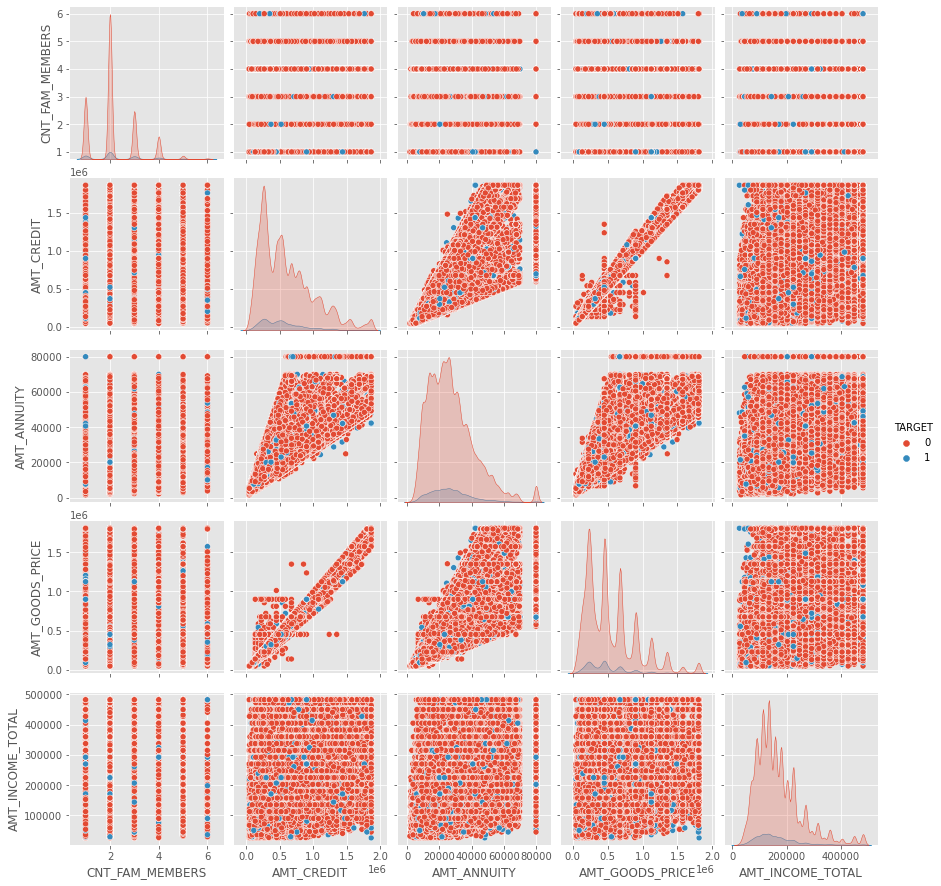

In [154]:
sns.pairplot(data=app[['TARGET','CNT_FAM_MEMBERS','AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE','AMT_INCOME_TOTAL']], hue='TARGET')
plt.show()

 CNT_FAM_MEMBERS is not related to other variable.

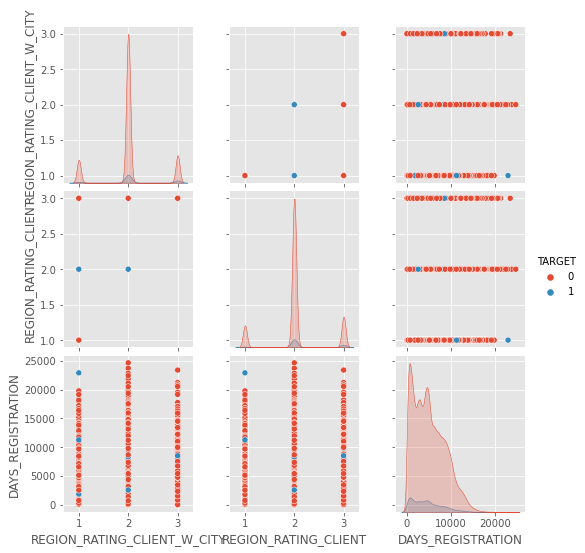

In [155]:
sns.pairplot(data=app[['TARGET','REGION_RATING_CLIENT_W_CITY','REGION_RATING_CLIENT', 'DAYS_REGISTRATION']], hue='TARGET')
plt.show()

For every value of Region rating by client and REGION_RATING_CLIENT_W_CITY more DAYS_REGISTRATION indicates assured payment of loans.

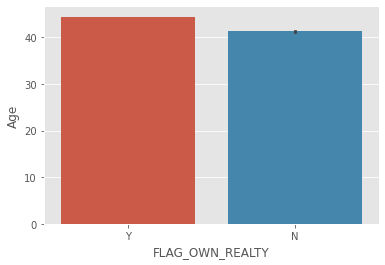

In [156]:
sns.barplot(data=app,x='FLAG_OWN_REALTY',y='Age')
plt.show()

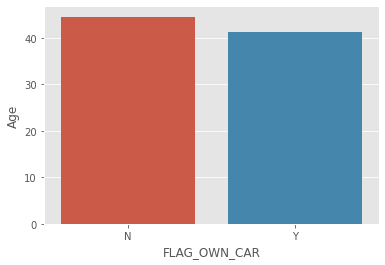

In [157]:
sns.barplot(data=app,x='FLAG_OWN_CAR',y='Age')
plt.show()

People who were above 40 and did not buy a car but had a property applied for loans

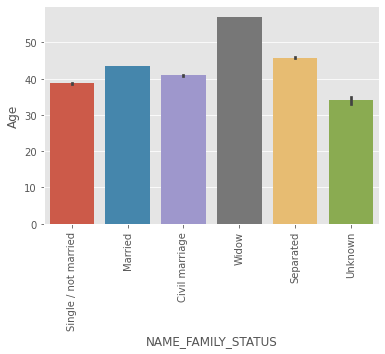

In [158]:
sns.barplot(data=app,x='NAME_FAMILY_STATUS',y='Age')
plt.xticks(rotation=90)
plt.show()

Mostly people with more age who have applied for loan are either widowed or separated.

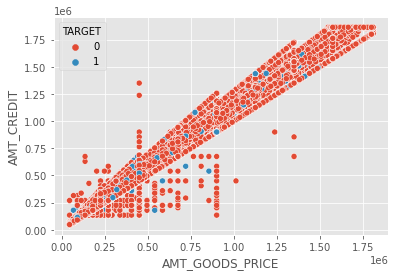

In [159]:
#Instead of the pair plot which becomes clumsy we plot scatter plot for more clarity
sns.scatterplot(data=app,x='AMT_GOODS_PRICE',y='AMT_CREDIT',hue='TARGET')
plt.show()

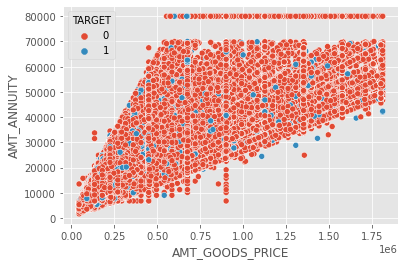

In [160]:
sns.scatterplot(data=app,x='AMT_GOODS_PRICE',y='AMT_ANNUITY',hue='TARGET')
plt.show()

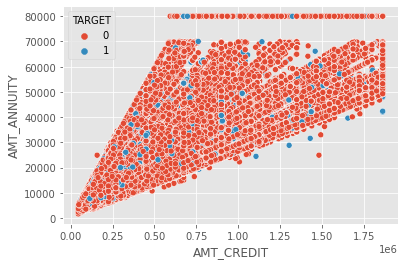

In [161]:
sns.scatterplot(data=app,x='AMT_CREDIT',y='AMT_ANNUITY',hue='TARGET')
plt.show()

**Inference**
- With increasing count of children, the applicant starts facing payment problem irrespective of income, credit amount, annuity and goods price with an exception if the salary of applicant is very high and age is relatively high.
- It becomes difficult for applicant to pay if the 'AMT_CREDIT and AMT_ANNUITY', 'AMT_CREDIT and AMT_Goods_price' , 'AMT_ANNUITY AND AMT_GOODS_PRICE' rises together.
- 'AMT_CREDIT and AMT_ANNUITY' , 'AMT_CREDIT and AMT_Goods_price' ,'AMT_ANNUITY AND AMT_GOODS_PRICE' have a rising relation.
- Larger the DAYS_REGISTRATION shows larger chances of getting payment of loan irrespective of AMT_INCOME_TOTAL,AMT_CREDIT, AMT_ANNUITY, AMT_GOODS_PRICE.
- An increasing relationship is established between AMT_GOODS_PRICE and AMT_CREDIT.
- Less family members and more days of registration leads to easy payment of loan amount.
- CNT_FAM_MEMBERS is not related to other variable.
- For every value of Region rating by client and REGION_RATING_CLIENT_W_CITY more DAYS_REGISTRATION indicates assured payment of loans.
- People who were above 40 and did not buy a car but had a property applied for loans
- Mostly people with more age who have applied for loan are either widowed or seperated.

# <font color = 'Red'>Correlation between Target and other variables</font>

- In app_T0 and app_T1, we will drop the below 2 columns for the following reasons:

- SK_ID_CURR since calculating correlation for the id makes no sense.

- TARGET: Since we have divided dataframes as per target 0 and 1. Hence the variance of target will be zero which gives NaN while calculating correlation.

In [162]:
app_t0_corr = app_t0.drop(['SK_ID_CURR', 'TARGET'],axis = 1)
app_t1_corr = app_t1.drop(['SK_ID_CURR', 'TARGET'],axis = 1)

In [163]:
app_t0_corr.head(1)

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,Age,AgeGroup,IncomeRange
1,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,1188,1186.0,291,Core staff,2,1,1,MONDAY,11,0,0,0,0,0,0,School,45,"(40, 50]",High


In [164]:
corr_app_t0 = abs(round(app_t0_corr.corr(),2))
corr_app_t1 = abs(round(app_t1_corr.corr(),2))

In [165]:
corr_app_t0.head(1)

,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,Age
CNT_CHILDREN,1.0,0.03,0.0,0.02,0.0,0.02,0.25,0.19,0.03,0.88,0.02,0.02,0.01,0.01,0.01,0.02,0.02,0.07,0.07,0.34


In [166]:
app_t0.shape

(282686, 36)

In [167]:
corr_app_t1.shape

(20, 20)

# Finding correlation of variables for Target = 0

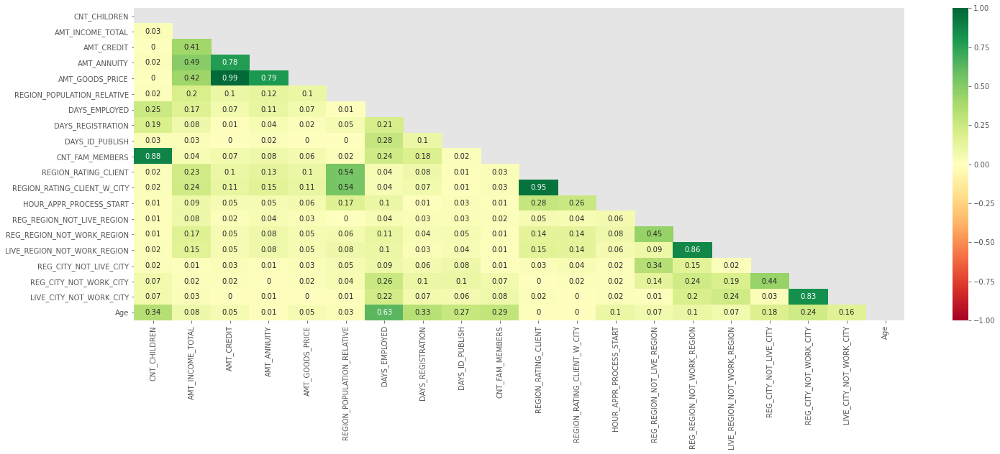

In [168]:
#plot heatmap to identify the correlation between different variables in the dataset for Target = 0
plt.figure(figsize = (24,8))
## define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(corr_app_t0, dtype=np.bool))
sns.heatmap(corr_app_t0,mask=mask,annot=True,vmin=-1, vmax=1,fmt='.2g',cmap='RdYlGn')
plt.show()

- ### Reference for understadning Stack() and unstack(concept)
https://www.datasciencemadesimple.com/reshape-using-stack-unstack-function-pandas-python/

In [169]:
#Finding top 10 for applicants who do not have difficulty in paying their loan
top_10_corr = corr_app_t0[corr_app_t0 == 1].unstack().sort_values(ascending = False).head(20)

print('The BELOW columns shows a perfect positive correlation\n')
print(top_10_corr)

The BELOW columns shows a perfect positive correlation

Age                          Age                            1.0
LIVE_CITY_NOT_WORK_CITY      LIVE_CITY_NOT_WORK_CITY        1.0
AMT_INCOME_TOTAL             AMT_INCOME_TOTAL               1.0
AMT_CREDIT                   AMT_CREDIT                     1.0
AMT_ANNUITY                  AMT_ANNUITY                    1.0
AMT_GOODS_PRICE              AMT_GOODS_PRICE                1.0
REGION_POPULATION_RELATIVE   REGION_POPULATION_RELATIVE     1.0
DAYS_EMPLOYED                DAYS_EMPLOYED                  1.0
DAYS_REGISTRATION            DAYS_REGISTRATION              1.0
DAYS_ID_PUBLISH              DAYS_ID_PUBLISH                1.0
CNT_FAM_MEMBERS              CNT_FAM_MEMBERS                1.0
REGION_RATING_CLIENT         REGION_RATING_CLIENT           1.0
REGION_RATING_CLIENT_W_CITY  REGION_RATING_CLIENT_W_CITY    1.0
HOUR_APPR_PROCESS_START      HOUR_APPR_PROCESS_START        1.0
REG_REGION_NOT_LIVE_REGION   REG_REGION_NOT_LIVE

In [170]:
# Finding the top 10 correlation pairs for Target = 0
top_10_corr = corr_app_t0[corr_app_t0 != 1].unstack().sort_values(ascending = False)
print("The top 10 correlation pairs for applicants who paid on time are:")
top_10_corr.head(20)

The top 10 correlation pairs for applicants who paid on time are:


AMT_CREDIT                   AMT_GOODS_PRICE                0.99
AMT_GOODS_PRICE              AMT_CREDIT                     0.99
REGION_RATING_CLIENT         REGION_RATING_CLIENT_W_CITY    0.95
REGION_RATING_CLIENT_W_CITY  REGION_RATING_CLIENT           0.95
CNT_FAM_MEMBERS              CNT_CHILDREN                   0.88
CNT_CHILDREN                 CNT_FAM_MEMBERS                0.88
REG_REGION_NOT_WORK_REGION   LIVE_REGION_NOT_WORK_REGION    0.86
LIVE_REGION_NOT_WORK_REGION  REG_REGION_NOT_WORK_REGION     0.86
REG_CITY_NOT_WORK_CITY       LIVE_CITY_NOT_WORK_CITY        0.83
LIVE_CITY_NOT_WORK_CITY      REG_CITY_NOT_WORK_CITY         0.83
AMT_GOODS_PRICE              AMT_ANNUITY                    0.79
AMT_ANNUITY                  AMT_GOODS_PRICE                0.79
AMT_CREDIT                   AMT_ANNUITY                    0.78
AMT_ANNUITY                  AMT_CREDIT                     0.78
Age                          DAYS_EMPLOYED                  0.63
DAYS_EMPLOYED            

The top 10 correlation pairs for applicants who made their payments on time

- AMT_GOODS_PRICE AMT_CREDIT 0.99
- REGION_RATING_CLIENT REGION_RATING_CLIENT_W_CITY 0.95
- CNT_CHILDREN CNT_FAM_MEMBERS 0.88
- LIVE_REGION_NOT_WORK_REGION REG_REGION_NOT_WORK_REGION 0.86
- REG_CITY_NOT_WORK_CITY LIVE_CITY_NOT_WORK_CITY 0.83
- AMT_CREDIT AMT_ANNUITY 0.79
- AMT_GOODS_PRICE AMT_ANNUITY 0.79
- DAYS_EMPLOYED Age 0.63
- REGION_RATING_CLIENT REGION_POPULATION_RELATIVE 0.54
- REGION_RATING_CLIENT_W_CITY REGION_POPULATION_RELATIVE 0.54

## Finding correlation of variables for Target = 1

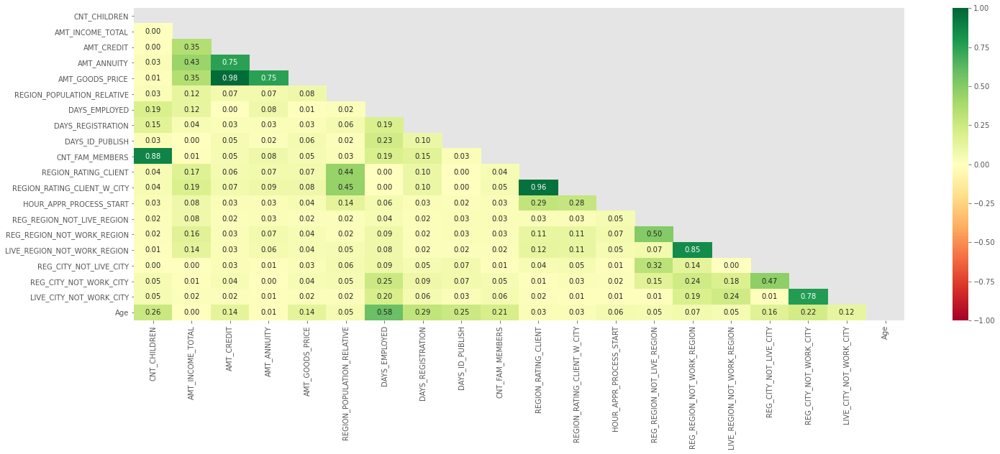

In [171]:
#plot heatmap to identify the correlation between different variables in the dataset for Target = 1
plt.figure(figsize=[24,8])
## define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(corr_app_t1, dtype=np.bool))
sns.heatmap(corr_app_t1,mask=mask,vmin=-1, vmax=1,annot=True,fmt='.2f',cmap='RdYlGn')
plt.show()

In [172]:
# Finding the top 10 correlation pairs for Target = 0
top_10_corr_1 = corr_app_t1[corr_app_t1 == 1].unstack().sort_values(ascending = False).head(20)

**What Is the Correlation Coefficient?**

- The correlation coefficient is a statistical measure of the strength of the relationship between the relative movements of two variables. The values range between -1.0 and 1.0. A calculated number greater than 1.0 or less than -1.0 means that there was an error in the correlation measurement. A correlation of -1.0 shows a perfect negative correlation, while a correlation of 1.0 shows a perfect positive correlation. A correlation of 0.0 shows no linear relationship between the movement of the two variables.

In [173]:
#Printing top 10 correlations for target =1
print('The BELOW columns shows a perfect positive correlation\n')
print(top_10_corr_1)

The BELOW columns shows a perfect positive correlation

Age                          Age                            1.0
LIVE_CITY_NOT_WORK_CITY      LIVE_CITY_NOT_WORK_CITY        1.0
AMT_INCOME_TOTAL             AMT_INCOME_TOTAL               1.0
AMT_CREDIT                   AMT_CREDIT                     1.0
AMT_ANNUITY                  AMT_ANNUITY                    1.0
AMT_GOODS_PRICE              AMT_GOODS_PRICE                1.0
REGION_POPULATION_RELATIVE   REGION_POPULATION_RELATIVE     1.0
DAYS_EMPLOYED                DAYS_EMPLOYED                  1.0
DAYS_REGISTRATION            DAYS_REGISTRATION              1.0
DAYS_ID_PUBLISH              DAYS_ID_PUBLISH                1.0
CNT_FAM_MEMBERS              CNT_FAM_MEMBERS                1.0
REGION_RATING_CLIENT         REGION_RATING_CLIENT           1.0
REGION_RATING_CLIENT_W_CITY  REGION_RATING_CLIENT_W_CITY    1.0
HOUR_APPR_PROCESS_START      HOUR_APPR_PROCESS_START        1.0
REG_REGION_NOT_LIVE_REGION   REG_REGION_NOT_LIVE

In [174]:
top_10_corr_1 = corr_app_t1[corr_app_t1 != 1].unstack().sort_values(ascending = False).head(20)
print('The BELOW columns shows a positive correlation values,for columns whole values between [0.0 - 0.99]\n')
print('The top 10 correlation pairs for applicants with payment difficulties\n')
print(top_10_corr_1)

The BELOW columns shows a positive correlation values,for columns whole values between [0.0 - 0.99]

The top 10 correlation pairs for applicants with payment difficulties

AMT_GOODS_PRICE              AMT_CREDIT                     0.98
AMT_CREDIT                   AMT_GOODS_PRICE                0.98
REGION_RATING_CLIENT_W_CITY  REGION_RATING_CLIENT           0.96
REGION_RATING_CLIENT         REGION_RATING_CLIENT_W_CITY    0.96
CNT_CHILDREN                 CNT_FAM_MEMBERS                0.88
CNT_FAM_MEMBERS              CNT_CHILDREN                   0.88
REG_REGION_NOT_WORK_REGION   LIVE_REGION_NOT_WORK_REGION    0.85
LIVE_REGION_NOT_WORK_REGION  REG_REGION_NOT_WORK_REGION     0.85
LIVE_CITY_NOT_WORK_CITY      REG_CITY_NOT_WORK_CITY         0.78
REG_CITY_NOT_WORK_CITY       LIVE_CITY_NOT_WORK_CITY        0.78
AMT_CREDIT                   AMT_ANNUITY                    0.75
AMT_GOODS_PRICE              AMT_ANNUITY                    0.75
AMT_ANNUITY                  AMT_GOODS_PRICE    

In [175]:
print(pre.shape)
print(pre.dtypes)
pre.head(2)

(1670214, 37)
SK_ID_PREV                       int64
SK_ID_CURR                       int64
NAME_CONTRACT_TYPE              object
AMT_ANNUITY                    float64
AMT_APPLICATION                float64
AMT_CREDIT                     float64
AMT_DOWN_PAYMENT               float64
AMT_GOODS_PRICE                float64
WEEKDAY_APPR_PROCESS_START      object
HOUR_APPR_PROCESS_START          int64
FLAG_LAST_APPL_PER_CONTRACT     object
NFLAG_LAST_APPL_IN_DAY           int64
RATE_DOWN_PAYMENT              float64
RATE_INTEREST_PRIMARY          float64
RATE_INTEREST_PRIVILEGED       float64
NAME_CASH_LOAN_PURPOSE          object
NAME_CONTRACT_STATUS            object
DAYS_DECISION                    int64
NAME_PAYMENT_TYPE               object
CODE_REJECT_REASON              object
NAME_TYPE_SUITE                 object
NAME_CLIENT_TYPE                object
NAME_GOODS_CATEGORY             object
NAME_PORTFOLIO                  object
NAME_PRODUCT_TYPE               object
CHANNEL_TYP

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0


**Analysing the previous_application.csv data**

In [176]:
#Calculating null percentage for previous application 
round(pre.isnull().sum()/pre.shape[0]*100,2).sort_values(ascending = False)

RATE_INTEREST_PRIVILEGED       99.64
RATE_INTEREST_PRIMARY          99.64
RATE_DOWN_PAYMENT              53.64
AMT_DOWN_PAYMENT               53.64
NAME_TYPE_SUITE                49.12
DAYS_TERMINATION               40.30
NFLAG_INSURED_ON_APPROVAL      40.30
DAYS_FIRST_DRAWING             40.30
DAYS_FIRST_DUE                 40.30
DAYS_LAST_DUE_1ST_VERSION      40.30
DAYS_LAST_DUE                  40.30
AMT_GOODS_PRICE                23.08
CNT_PAYMENT                    22.29
AMT_ANNUITY                    22.29
PRODUCT_COMBINATION             0.02
SK_ID_CURR                      0.00
NAME_CONTRACT_TYPE              0.00
AMT_CREDIT                      0.00
WEEKDAY_APPR_PROCESS_START      0.00
HOUR_APPR_PROCESS_START         0.00
FLAG_LAST_APPL_PER_CONTRACT     0.00
NFLAG_LAST_APPL_IN_DAY          0.00
AMT_APPLICATION                 0.00
NAME_PAYMENT_TYPE               0.00
NAME_CASH_LOAN_PURPOSE          0.00
NAME_CONTRACT_STATUS            0.00
DAYS_DECISION                   0.00
C

In [177]:
#list to remove null values>40%

remove_cols = pre.isnull().sum()*100/pre.shape[0]

remove_cols = remove_cols[remove_cols>40]

remove_cols.index

Index(['AMT_DOWN_PAYMENT', 'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'NAME_TYPE_SUITE', 'DAYS_FIRST_DRAWING',
       'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE',
       'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')

In [178]:
#dropping columns having null value percentage over 40
pre.drop(remove_cols.index,inplace=True,axis =1)

In [179]:
pre.shape

(1670214, 26)

In [180]:
pre.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 26 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_GOODS_PRICE              1284699 non-null  float64
 7   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 8   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 9   FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 10  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 11  NAME_CASH_LOAN_PURPOSE       1670214 non-null  object 
 12  NAME_CONTRACT_STATUS         1670214 non-n

**Decription of the below columns of the below columns**

- CODE_REJECT_REASON - Why was the previous application rejected

- NAME_CASH_LOAN_PURPOSE - Purpose of the cash loan


In [181]:
pre.NAME_CASH_LOAN_PURPOSE.unique()

array(['XAP', 'XNA', 'Repairs', 'Everyday expenses', 'Car repairs',
       'Building a house or an annex', 'Other', 'Journey',
       'Purchase of electronic equipment', 'Medicine',
       'Payments on other loans', 'Urgent needs', 'Buying a used car',
       'Buying a new car', 'Buying a holiday home / land', 'Education',
       'Buying a home', 'Furniture', 'Buying a garage',
       'Business development', 'Wedding / gift / holiday', 'Hobby',
       'Gasification / water supply', 'Refusal to name the goal',
       'Money for a third person'], dtype=object)

In [182]:
pre.CODE_REJECT_REASON.unique()

array(['XAP', 'HC', 'LIMIT', 'CLIENT', 'SCOFR', 'SCO', 'XNA', 'VERIF',
       'SYSTEM'], dtype=object)

**As Loan Purpose of XAP value is unclear and is hindering analysis on the trends, removing this value.**

In [183]:
#Removing null values i.e. rows where NAME_CASH_LOAN_PURPOSE = XNA 
pre.drop(pre[pre['NAME_CASH_LOAN_PURPOSE']=='XNA'].index,inplace=True)

In [184]:
pre.NAME_CASH_LOAN_PURPOSE.value_counts()

XAP                                 922661
Repairs                              23765
Other                                15608
Urgent needs                          8412
Buying a used car                     2888
Building a house or an annex          2693
Everyday expenses                     2416
Medicine                              2174
Payments on other loans               1931
Education                             1573
Journey                               1239
Purchase of electronic equipment      1061
Buying a new car                      1012
Wedding / gift / holiday               962
Buying a home                          865
Car repairs                            797
Furniture                              749
Buying a holiday home / land           533
Business development                   426
Gasification / water supply            300
Buying a garage                        136
Hobby                                   55
Money for a third person                25
Refusal to 

**Merging current and previous data sets**

In [185]:
merge_app = app.merge(pre, on = 'SK_ID_CURR', how = 'inner')

In [186]:
merge_app.shape

(846350, 61)

In [187]:
# CLEANING THE MERGED DATA
list(merge_app.columns)

['SK_ID_CURR',
 'TARGET',
 'NAME_CONTRACT_TYPE_x',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT_x',
 'AMT_ANNUITY_x',
 'AMT_GOODS_PRICE_x',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OCCUPATION_TYPE',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'WEEKDAY_APPR_PROCESS_START_x',
 'HOUR_APPR_PROCESS_START_x',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'ORGANIZATION_TYPE',
 'Age',
 'AgeGroup',
 'IncomeRange',
 'SK_ID_PREV',
 'NAME_CONTRACT_TYPE_y',
 'AMT_ANNUITY_y',
 'AMT_APPLICATION',
 'AMT_CREDIT_y',
 'AMT_GOODS_PRICE_y',
 'WEEKDAY_APPR_PROCESS_START_y',
 'HOUR_APPR_PROCESS_START_y',
 'FLAG_LAST_APPL_PER_CONT

Since we have analysed few columns from above previosuly, we can remove those columns

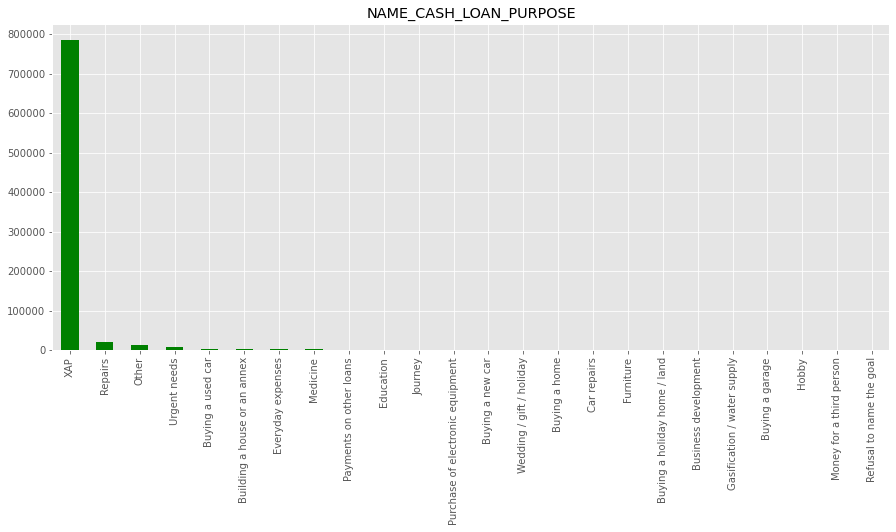

In [188]:
#UNIVARIATE ANALYSIS
#Plotting counts of NAME_CASH_LOAN_PURPOSE
plt.figure(figsize=(15,6))
merge_app['NAME_CASH_LOAN_PURPOSE'].value_counts().plot(kind='bar', color = 'green')
plt.title('NAME_CASH_LOAN_PURPOSE')
plt.show()

**As Loan Purpose of XAP value is unclear and is hindering analysis on the trends, removing this value**

In [189]:
#Removing XAP value rows as value seems to be randomly assigned or is not applicable 
merge_app=merge_app.drop(merge_app[merge_app['NAME_CASH_LOAN_PURPOSE']=='XAP'].index)

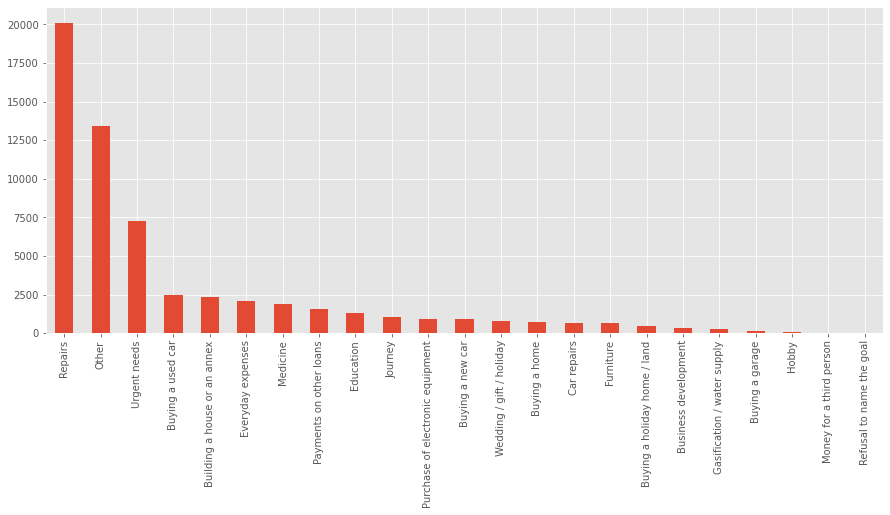

In [190]:
#Plotting counts of NAME_CASH_LOAN_PURPOSE again after removing XAP value entries
plt.figure(figsize=(15,6))
merge_app.NAME_CASH_LOAN_PURPOSE.value_counts().plot.bar()
plt.show()

Loans have been requested maximum for Repairs, Urgent needs and unspecified categories. There are almost no loans issued for a third person or because of customer refusal to reveal the objective of taking a loan.

In [191]:
#obtaining result only for defaulters
merge_app_t1 = merge_app[merge_app.TARGET == 1]

In [192]:
plot_merge = merge_app.filter(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE_x', 'CODE_GENDER', 'NAME_EDUCATION_TYPE', 'OCCUPATION_TYPE','ORGANIZATION_TYPE', 'AgeGroup',
       'IncomeRange', 'NAME_CASH_LOAN_PURPOSE', 'NAME_CONTRACT_STATUS',
       'CODE_REJECT_REASON'], axis = 1)

plot_merge.drop('SK_ID_CURR', axis = 1, inplace = True)

plot_merge.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59413 entries, 71 to 846348
Data columns (total 11 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   TARGET                  59413 non-null  int64   
 1   NAME_CONTRACT_TYPE_x    59413 non-null  object  
 2   CODE_GENDER             59413 non-null  object  
 3   NAME_EDUCATION_TYPE     59413 non-null  object  
 4   OCCUPATION_TYPE         59413 non-null  object  
 5   ORGANIZATION_TYPE       59413 non-null  object  
 6   AgeGroup                59413 non-null  category
 7   IncomeRange             59413 non-null  category
 8   NAME_CASH_LOAN_PURPOSE  59413 non-null  object  
 9   NAME_CONTRACT_STATUS    59413 non-null  object  
 10  CODE_REJECT_REASON      59413 non-null  object  
dtypes: category(2), int64(1), object(8)
memory usage: 4.6+ MB


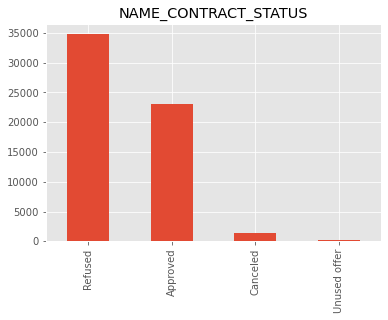

In [193]:
#Plotting counts of NAME_CONTRACT_STATUS
merge_app.NAME_CONTRACT_STATUS.value_counts().plot.bar()
plt.title('NAME_CONTRACT_STATUS')
plt.show()

Maximum number of loans applied by existing customers previously have been refused.

**Univariate Analysis for defaulters**

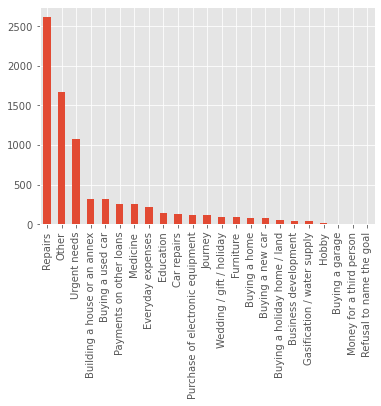

In [194]:
#Plotting counts of NAME_CASH_LOAN_PURPOSE only for defaulter
merge_app_t1.NAME_CASH_LOAN_PURPOSE.value_counts().plot.bar()
plt.show()

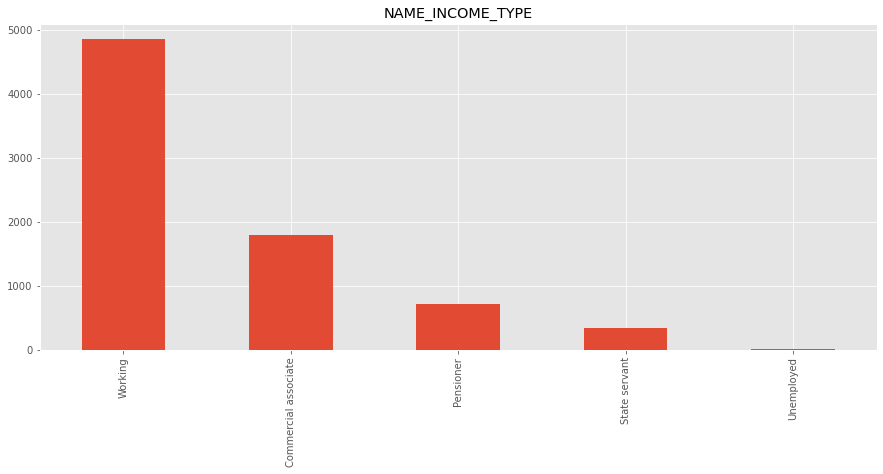

In [195]:
#Plotting counts of NAME_INCOME_TYPE only for defaulter
plt.figure(figsize=(15,6))
merge_app_t1['NAME_INCOME_TYPE'].value_counts().plot.bar()
plt.title('NAME_INCOME_TYPE')
plt.show()

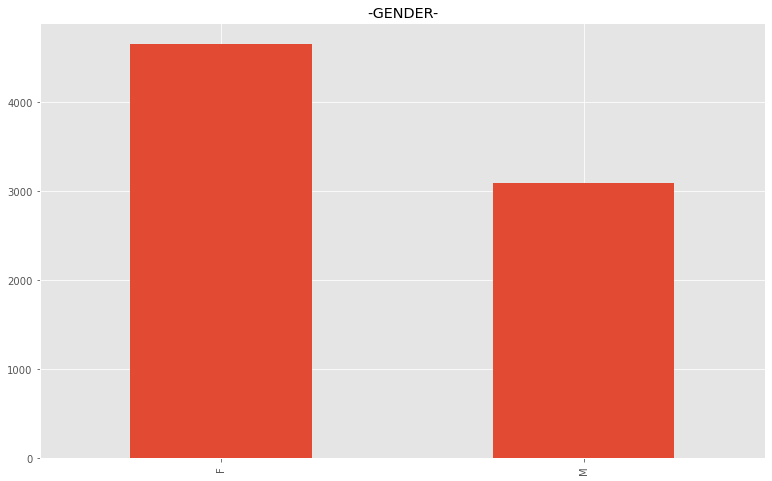

In [196]:
#Plotting counts of CODE_GENDER only for defaulter
plt.figure(figsize=(13,8))
merge_app_t1['CODE_GENDER'].value_counts().plot.bar()
plt.title('-GENDER-')
plt.show()

Defaulters majorly belong to the Working category, have applied maximum number of times for loans on Repairs and females show a significantly higher trend

# **Bivariate Analysis**

In [197]:
plot_merge.NAME_CONTRACT_STATUS.unique()

array(['Approved', 'Refused', 'Canceled', 'Unused offer'], dtype=object)

In [198]:
#Dividing the data by NAME_CONTRACT_STATUS into separate data frames
ma_approved = plot_merge[plot_merge.NAME_CONTRACT_STATUS == 'Approved']
merge_app_refused = plot_merge[plot_merge["NAME_CONTRACT_STATUS"]  == 'Refused']
merge_app_Cancelled = plot_merge[plot_merge["NAME_CONTRACT_STATUS"]  == 'Canceled']
merge_app_Unused = plot_merge[plot_merge["NAME_CONTRACT_STATUS"]  == 'Unused offer']

In [199]:
print(merge_app_refused.shape)
print(ma_approved.shape)
print(merge_app_Cancelled.shape)
print(merge_app_Unused.shape)

(34786, 11)
(23075, 11)
(1369, 11)
(183, 11)


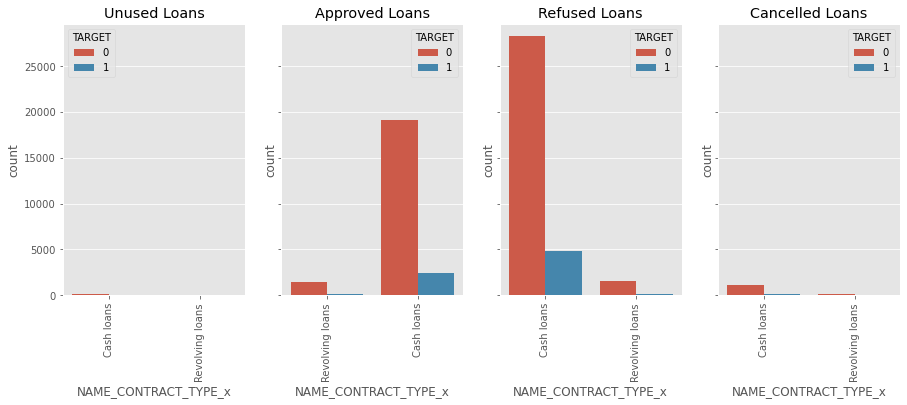

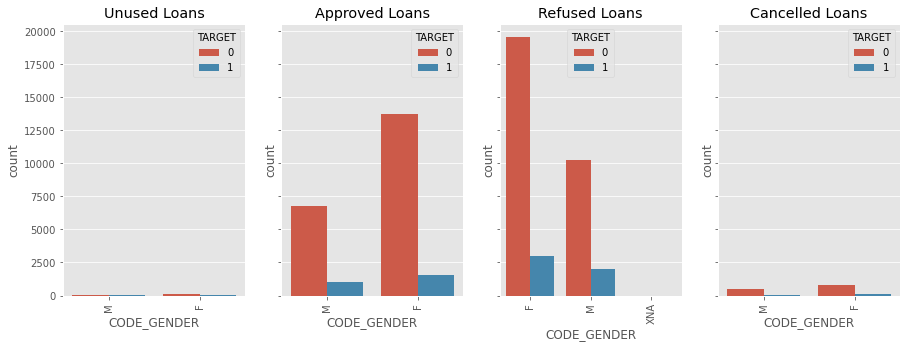

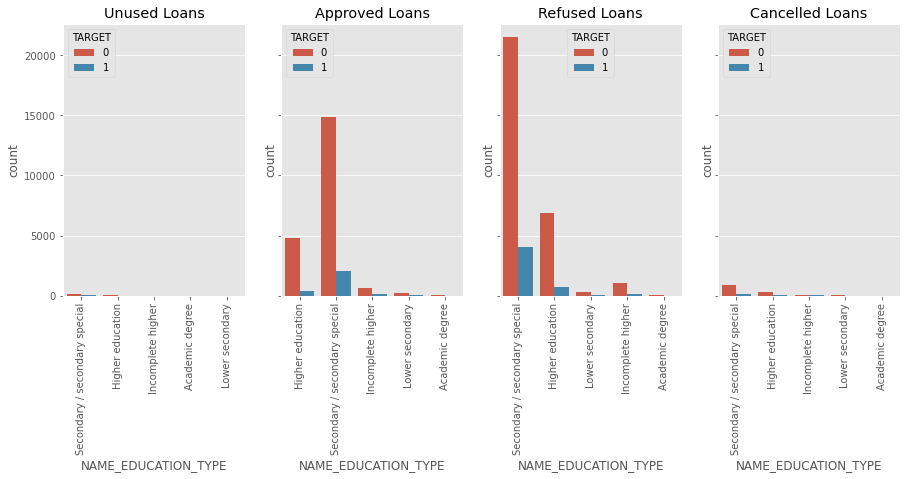

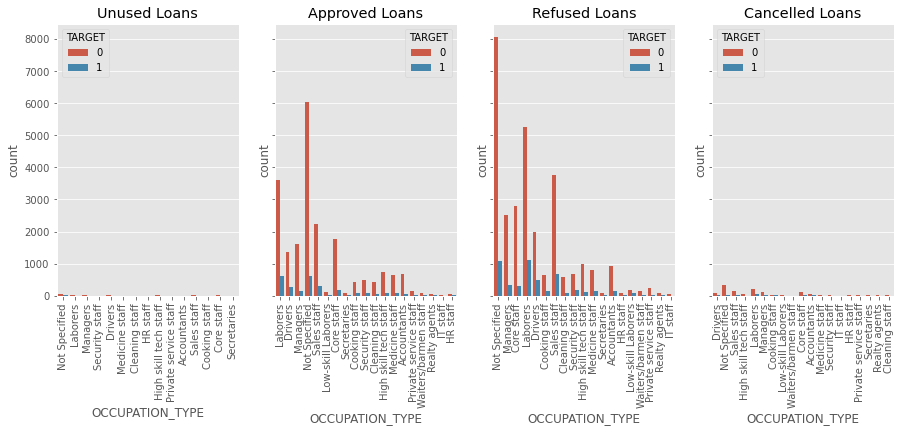

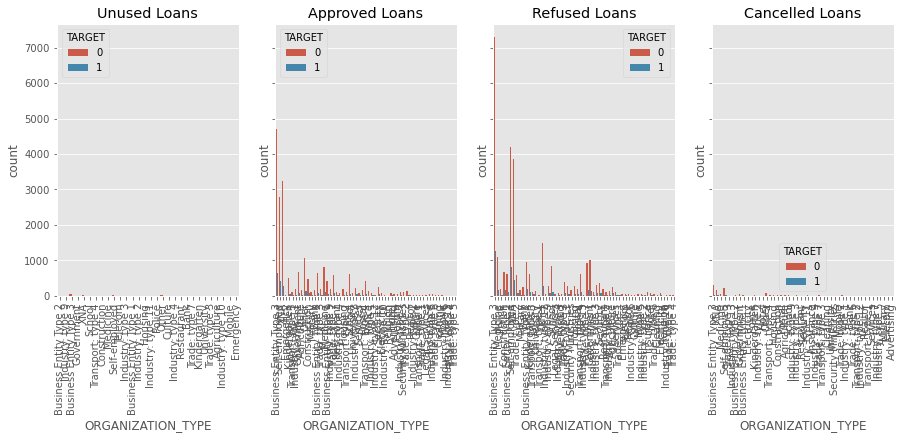

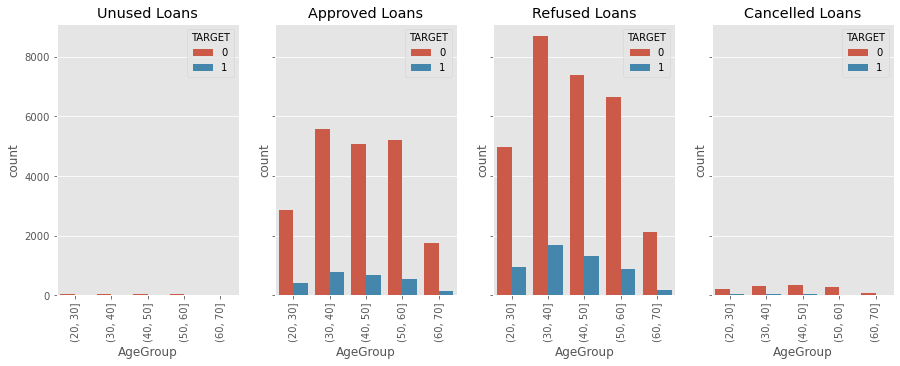

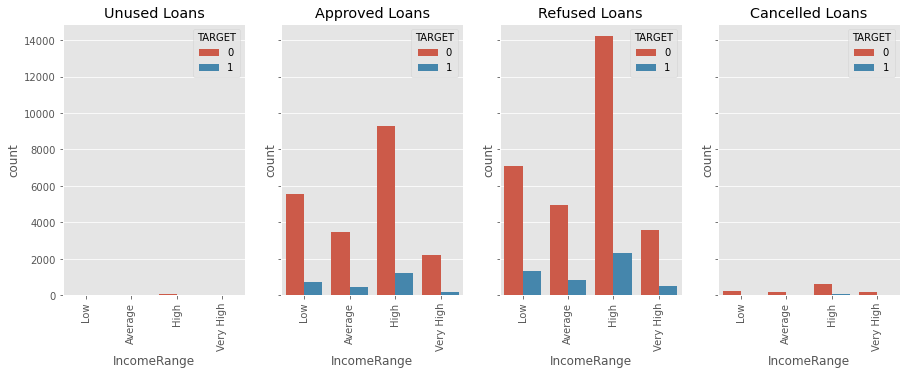

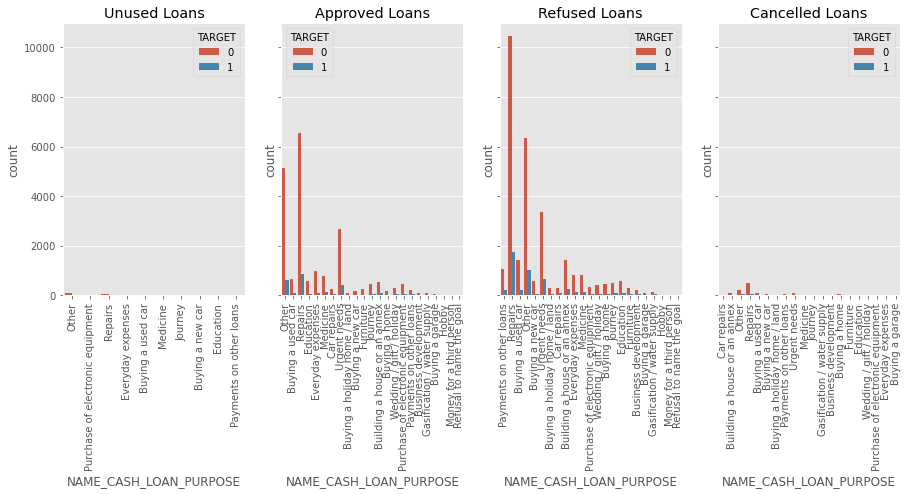

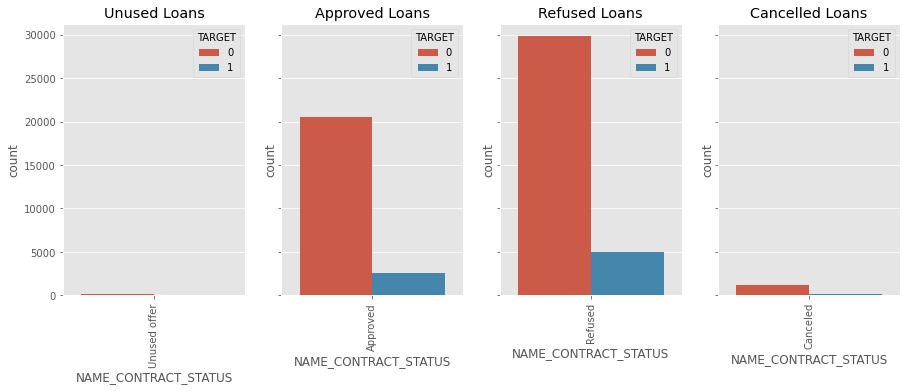

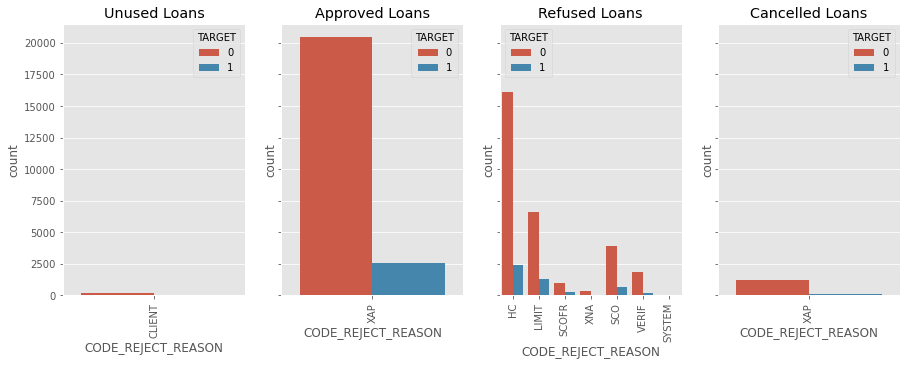

In [200]:
#plotting against Target for categorical variables to analyse trend 
i = 0

for column in merge_app_Unused:
    if column != 'TARGET':
        fig, axes = plt.subplots(1, 4, figsize=(15, 5), sharey = True)
       

        sns.countplot(ax = axes[0], x=merge_app_Unused[column],hue=merge_app_Unused['TARGET'],data=merge_app_Unused)
        axes[0].set_title('Unused Loans')
        
        sns.countplot(ax = axes[1], x=ma_approved[column],hue=ma_approved['TARGET'],data=ma_approved)
        axes[1].set_title('Approved Loans')

        sns.countplot(ax = axes[2], x=merge_app_refused[column],hue=merge_app_refused['TARGET'],data=merge_app_refused)
        axes[2].set_title('Refused Loans')

        sns.countplot(ax = axes[3], x=merge_app_Cancelled[column],hue=merge_app_Cancelled['TARGET'],data=merge_app_Cancelled)
        axes[3].set_title('Cancelled Loans')

        for i in range(4):
            for tick in axes[i].get_xticklabels():
                tick.set_rotation(90)    

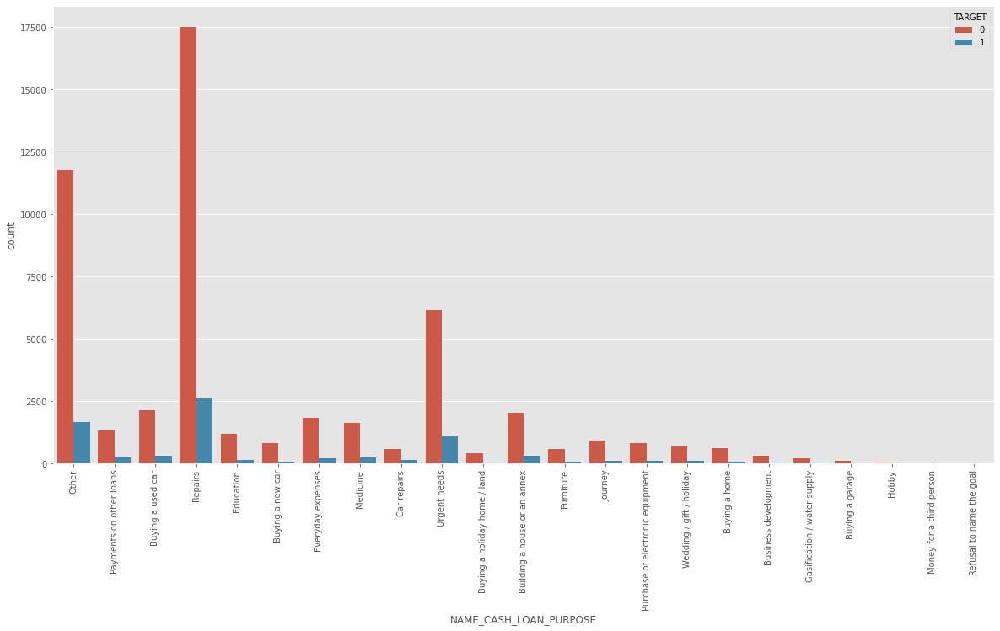

In [201]:
#For better understanding, re-plotting NAME_CASH_LOAN_PURPOSE vs TARGET.
plt.figure(figsize=(20,10))
sns.countplot(x=merge_app['NAME_CASH_LOAN_PURPOSE'],hue=merge_app['TARGET'],data=merge_app)
plt.xticks(rotation = 90)
plt.show()

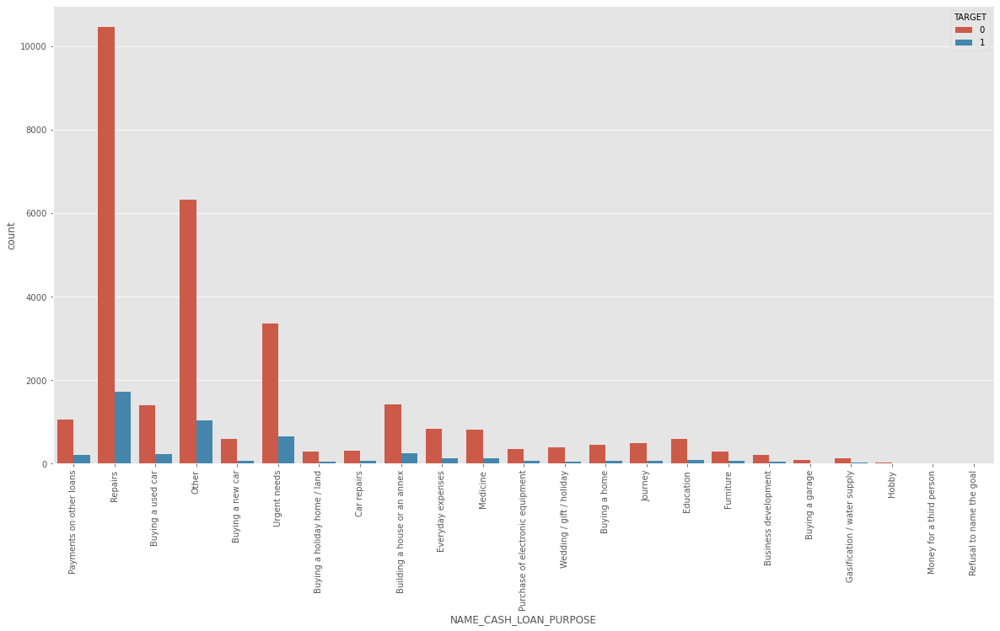

In [202]:
plt.figure(figsize=(20,10))
sns.countplot(x=merge_app_refused['NAME_CASH_LOAN_PURPOSE'],hue=merge_app_refused['TARGET'],data=merge_app_refused)
plt.xticks(rotation = 90)
plt.show()

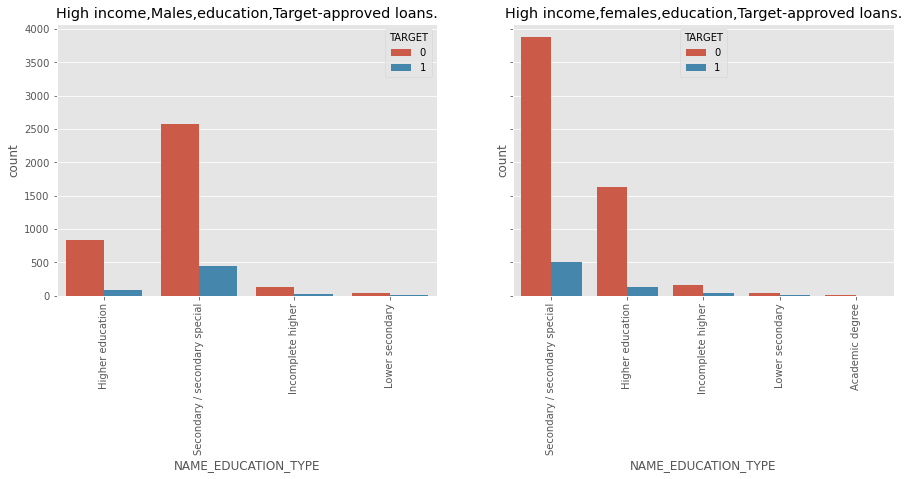

In [203]:
#Visualizing gender, income, education along with target for approved loans.

fig, axes = plt.subplots(1, 2, figsize=(15, 5), sharey = True)
sns.countplot(ax = axes[0],x=ma_approved[(ma_approved['CODE_GENDER']=='M') & (ma_approved['IncomeRange']=='High')]['NAME_EDUCATION_TYPE'],hue=ma_approved['TARGET'],data=ma_approved)
axes[0].set_title('High income,Males,education,Target-approved loans.')

sns.countplot(ax = axes[1],x=ma_approved[(ma_approved['CODE_GENDER']=='F') & (ma_approved['IncomeRange']=='High')]['NAME_EDUCATION_TYPE'],hue=ma_approved['TARGET'],data=ma_approved)
axes[1].set_title('High income,females,education,Target-approved loans.')
plt.xticks(rotation = 90)

for i in range(2):
            for tick in axes[i].get_xticklabels():
                tick.set_rotation(90)
plt.show()

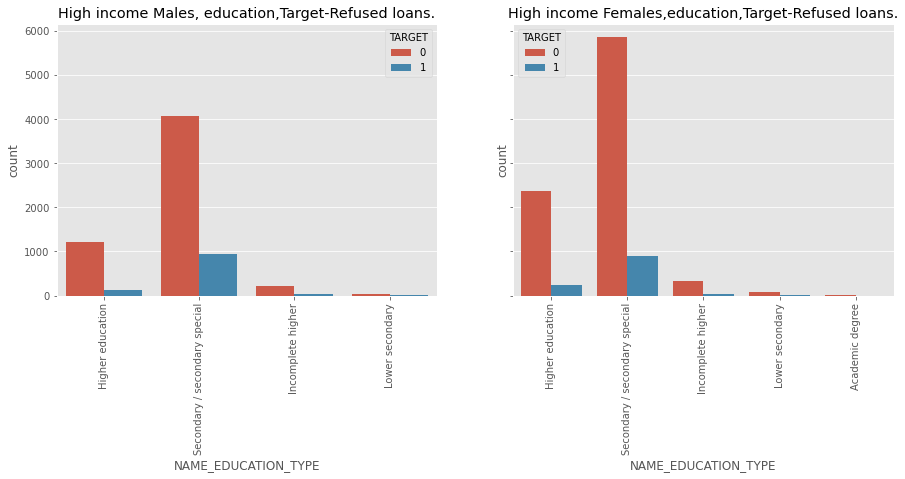

In [204]:
#Visualizing gender, income, education along with target for refused loans.

fig, axes = plt.subplots(1, 2, figsize=(15, 5), sharey = True)
sns.countplot(ax = axes[0],x=merge_app_refused[(merge_app_refused['CODE_GENDER']=='M') & (merge_app_refused['IncomeRange']=='High')]['NAME_EDUCATION_TYPE'],hue=merge_app_refused['TARGET'],data=merge_app_refused)
axes[0].set_title('High income Males, education,Target-Refused loans.')

sns.countplot(ax = axes[1],x=merge_app_refused[(merge_app_refused['CODE_GENDER']=='F') & (merge_app_refused['IncomeRange']=='High')]['NAME_EDUCATION_TYPE'],hue=merge_app_refused['TARGET'],data=merge_app_refused)
axes[1].set_title('High income Females,education,Target-Refused loans.')
plt.xticks(rotation = 90)

for i in range(2):
            for tick in axes[i].get_xticklabels():
                tick.set_rotation(90)
plt.show()

In [205]:
merge_app_refused[merge_app_refused['IncomeRange']=='High']['NAME_EDUCATION_TYPE'].head()

103                 Higher education
148                 Higher education
149                 Higher education
151                 Higher education
176    Secondary / secondary special
Name: NAME_EDUCATION_TYPE, dtype: object

**INFERENCE**

- For refused loans, a massive number of applicants were refused of loans even if they wouldn’t have ended defaulting across all age groups.
- For the approved cases, the bank endured more losses for Cash loans when compared to revolving loans because there were applicants who couldn't pay their installments on time.
- For the approved cases, we observed more loses for male category when the bank approved loans to them.
- The ratio of Refused loans is better for defaulting adult males, despite the fact that the count number of applications shows a higher trend in woman populace.
- Applicants having secondary or secondary special education display maximum trend in Refused as well as accepted loans and to a lesser quantity in Cancelled loans.
- Banks have made proportionally more losses by approving loans to labourers, drivers and non-specified occupation types. Also banks have refused more loans proportionally for the 3 categories and sales staff.
- In case of approved loans, the ratio of applicants paying the amounts to not paying the amounts are same in the age group of 30-40 and 40-50.
- Highest percentage of defaulters can be observed in case where Cash loans have been requested for Repairs. Highest percentage of Refusal of loans also is in the same category. Based on proportionally high defaulters, more care should be taken while giving loans for repairs, other purposes, buying a used car, buying a house or an annex.
- Loans are refused to high earning applicants. People falling into the age group of 30-40 years are usually not given loans based on their of defaulting propertions.
- The proporation of defaulters and not defaulters are almost same in case of approved and refused loans. More strict rules have to be taken in to cosideration while lending loans to such cases.
- While ananlysiing Income and Gender columns, High earner Males with secondary education are more likely to default. This analysis follows by low earner Male and then high income female and last observation with  low earner females.

**MULTIVARIATE ANALYSIS**

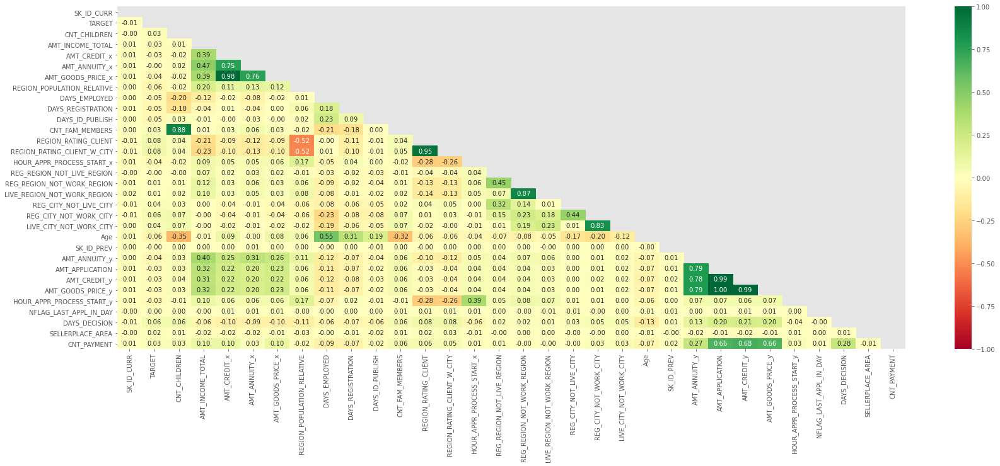

In [206]:
#plot heatmap to identify the correlation between different variables in the merged dataset
plt.figure(figsize = (28,10))
mask = np.triu(np.ones_like(merge_app.corr(), dtype=np.bool))
sns.heatmap(round(merge_app.corr(),3),mask=mask, vmin=-1, vmax=1, annot = True, fmt='.2f',cmap= 'RdYlGn')
plt.show()

**A very high correlation is observed between Application Amount and the credit. Also, we can observe a correlation trend similar to the one we observed while analysing application data.
- Below we haveteh calculations for the top correlated columns
**

In [207]:
#finding the top 10 correlation pairs for Target = 0
refused = round(merge_app[merge_app["NAME_CONTRACT_STATUS"] == 'Refused'].corr(),3)
approved = round(merge_app[merge_app["NAME_CONTRACT_STATUS"] == 'Approved'].corr(),3)
cancelled = round(merge_app[merge_app["NAME_CONTRACT_STATUS"] == 'Cancelled'].corr(),3)
unused = round(merge_app[merge_app["NAME_CONTRACT_STATUS"] == 'Unused offer'].corr(),3)

print(refused[refused!=1].unstack().sort_values(ascending = False).drop_duplicates().head(10))
print('=======================================================================================')
print(approved[approved!=1].unstack().sort_values(ascending = False).drop_duplicates().head(10))
print('=======================================================================================')
print(cancelled[cancelled!=1].unstack().sort_values(ascending = False).drop_duplicates().head(10))
print('=======================================================================================')
print(unused[unused!=1].unstack().sort_values(ascending = False).drop_duplicates().head(10))
print('=======================================================================================')

AMT_GOODS_PRICE_y            AMT_CREDIT_y                   0.995
AMT_CREDIT_x                 AMT_GOODS_PRICE_x              0.984
REGION_RATING_CLIENT_W_CITY  REGION_RATING_CLIENT           0.945
CNT_FAM_MEMBERS              CNT_CHILDREN                   0.883
REG_REGION_NOT_WORK_REGION   LIVE_REGION_NOT_WORK_REGION    0.854
REG_CITY_NOT_WORK_CITY       LIVE_CITY_NOT_WORK_CITY        0.824
AMT_ANNUITY_y                AMT_APPLICATION                0.814
                             AMT_CREDIT_y                   0.811
AMT_ANNUITY_x                AMT_GOODS_PRICE_x              0.744
AMT_CREDIT_x                 AMT_ANNUITY_x                  0.743
dtype: float64
AMT_APPLICATION             AMT_CREDIT_y                   0.994
AMT_CREDIT_x                AMT_GOODS_PRICE_x              0.986
REGION_RATING_CLIENT        REGION_RATING_CLIENT_W_CITY    0.949
REG_REGION_NOT_WORK_REGION  LIVE_REGION_NOT_WORK_REGION    0.886
CNT_FAM_MEMBERS             CNT_CHILDREN                   0.876
